In [1]:
import argparse
import torch
import os
import torch.nn as nn
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
#os.environ['CUDA_VISIBLE_DEVICES'] = "0"
import numpy as np
from torchvision import transforms
import gzip
import pickle
from PIL import Image
from tqdm import tqdm
from typing import Optional
import math
from PIL import Image
import PIL
import cv2
from matplotlib import pyplot as plt
from vitunet.VIT import TransformerModel
#from medpy.metric.binary import obj_asd,asd,hd,dc,assd,jc
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
import segmentation_models_pytorch as smp
import matplotlib.pyplot as plt
from medpy.metric.binary import obj_asd,asd,hd,hd95,dc,assd,jc,recall,specificity,sensitivity,precision
import GeodisTK
from scipy import ndimage
import pandas as pd
import axialtrans
from axialtrans import MedT128, MedT64


/home/ma-user/anaconda3/envs/PyTorch-1.10.2/lib/python3.7/site-packages/requests/__init__.py:104: RequestsDependencyWarning: urllib3 (1.26.12) or chardet (5.0.0)/charset_normalizer (2.0.12) doesn't match a supported version!
  RequestsDependencyWarning)


In [2]:
def parse_args():
    parser = argparse.ArgumentParser(description="pytorch dcm training")

    parser.add_argument("--data-path", default="/home/ma-user/work/ct/", help="root")
    parser.add_argument("--train-rates", default=0.6, type=float, help='train datasets rate')
    parser.add_argument("--trainval-rates", default=0.8, type=float, help='val datasets rate')
    parser.add_argument("--show-number", default=4, type=int, help='show datalodater figures numbers')
    parser.add_argument("--resize", default=256, type=int, help="resize fig")
    parser.add_argument('--save_freq', type=int, default=60)
    parser.add_argument("--aux", default=True, type=bool, help="auxilier loss")
    parser.add_argument("--device", default="cuda", help="training device")
    parser.add_argument("-b", "--batch-size", default=4, type=int)
    parser.add_argument("--epochs", default=60, type=int, metavar="N",
                        help="number of total epochs to train")

    parser.add_argument('--lr', default=0.01, type=float, help='initial learning rate')
    parser.add_argument('--momentum', default=0.9, type=float, metavar='M',
                        help='momentum')
    parser.add_argument('--wd', '--weight-decay', default=1e-4, type=float,
                        metavar='W', help='weight decay (default: 1e-4)',
                        dest='weight_decay')
    parser.add_argument('--print-freq', default=10, type=int, help='print frequency')
    parser.add_argument('--resume', default='', help='resume from checkpoint')
    parser.add_argument('--start-epoch', default=0, type=int, metavar='N',
                        help='start epoch')
    # Mixed precision training parameters
    parser.add_argument("--amp", default=False, type=bool,
                        help="Use torch.cuda.amp for mixed precision training")
    parser.add_argument('--save-best', default=True, type=bool, help='only save best dice weights')

    args = parser.parse_args(args=[])

    return args


In [3]:
def read_split_data():
    assert os.path.exists(args.data_path), "dataset root: {} does not exist.".format(args.data_path)
    
    datasets = [cla for cla in os.listdir(args.data_path) if os.path.isdir(os.path.join(args.data_path, cla))]
    datasets.sort()
    supported = [".jpg", ".JPG", ".png", ".PNG", ".gz"]  # 支持的文件后缀类型

    cla_image = datasets[0]  # datasets[0] = image
    cla_label = datasets[1]  # datasets[1] = label
    cla_path = os.path.join(args.data_path, cla_image)
    cla_label_path = os.path.join(args.data_path, cla_label)
    
    # 获取images和labels的路径
    images = [os.path.join(args.data_path, cla_image, i) for i in os.listdir(cla_path) if os.path.splitext(i)[-1] in supported]
    labels = [os.path.join(args.data_path, cla_label, i) for i in os.listdir(cla_label_path) if os.path.splitext(i)[-1] in supported]
    
    # 划分训练集与验证集与测试集
    train_images_path = images[0:int(len(images)*args.train_rates)]
    train_images_label = labels[0:int(len(labels)*args.train_rates)]
    #val_images_path = images[int(len(images)*args.train_rates):]
    val_images_path = images[int(len(images)*args.train_rates):int(len(images)*args.trainval_rates)]
    #val_images_label = labels[int(len(labels)*args.train_rates):]
    val_images_label = labels[int(len(labels)*args.train_rates):int(len(images)*args.trainval_rates)]
    test_images_path = images[int(len(images)*args.trainval_rates):]
    test_images_label = labels[int(len(images)*args.trainval_rates):]
    
    print('train numbers:',len(train_images_path))
    print('val numbers:',len(val_images_path))
    print('test numbers:',len(test_images_path))

    return train_images_path, train_images_label, val_images_path, val_images_label, test_images_path, test_images_label


def read_image_label(image_path,label_path):
    
    with gzip.open(image_path, 'rb') as unzipped_data:
        image = pickle.load(unzipped_data)
    with gzip.open(label_path, 'rb') as unzipped_data:
        label = pickle.load(unzipped_data)
    image = np.expand_dims(image,axis=0)
    label = np.expand_dims(label,axis=0)
    
    return image,label


def show_loader(train_loader):
    img,label=next(iter(train_loader))
    print('img shape:',img.shape)
    print('label shape:',label.shape)
    print('imge_max and imge_min:',img.max(), img.min())
    print('label_max and label_min:',label.max(), label.min())
    print(img.dtype)
    print(label.dtype)
    plt.figure(figsize=(12,8))
    for i,(img,label) in enumerate(zip(img[:args.show_number],label[:args.show_number])):
        img = np.squeeze(img)
        label = np.squeeze(label)
        img = np.array(img)
        img = PIL.Image.fromarray(img)
        plt.subplot(2,4,i+1)
        plt.imshow(img,cmap='gray')
        plt.subplot(2,4,i+5)
        plt.imshow(label,cmap='gray')


def main_dataloader():
    train_images_path, train_images_label, val_images_path, val_images_label, test_images_path, test_images_label = read_split_data()
    
    data_transform = {"train": transforms.Compose([transforms.ToTensor(),transforms.Resize((512, 512))]),
                  "val": transforms.Compose([transforms.ToTensor(),transforms.Resize((512, 512))]),
                     "test": transforms.Compose([transforms.ToTensor(),transforms.Resize((512, 512))])}
    
    train_data=MyDataSet(train_images_path,train_images_label,data_transform['train'])
    train_loader = torch.utils.data.DataLoader(train_data,
                                               batch_size=args.batch_size,
                                               shuffle=False,
                                               collate_fn=train_data.collate_fn)
    
    val_data=MyDataSet(val_images_path,val_images_label,data_transform['val'])
    val_loader = torch.utils.data.DataLoader(val_data,
                                               batch_size=args.batch_size,
                                               shuffle=False,
                                               collate_fn=train_data.collate_fn)
    test_data=MyDataSet(test_images_path,test_images_label,data_transform['test'])
    test_loader = torch.utils.data.DataLoader(test_data,
                                               batch_size=args.batch_size,
                                               shuffle=False,
                                               collate_fn=train_data.collate_fn)
    return train_loader, val_loader, test_loader


# In[4]:


class MyDataSet(torch.utils.data.Dataset):
    """自定义数据集"""

    def __init__(self, images_path: list, images_label: list, transform=None):
        self.images_path = images_path
        self.images_label = images_label
        self.transform = transform

    def __len__(self):
        return len(self.images_path)

    def __getitem__(self, item):
        image, label = read_image_label(self.images_path[item], self.images_label[item])

        #         image_min = np.min(image, axis=(1,2), keepdims=True)
        #         image_max = np.max(image, axis=(1,2), keepdims=True)
        #         image = (image - image_min) / (image_max - image_min)

        if image.shape[0] == 1:
            image = image[0]
        img_open = Image.fromarray(image)
        img = self.transform(img_open)
        img = img.type(torch.FloatTensor)

        if label.shape[0] == 1:
            label = label[0]
        label_open = Image.fromarray(label)
        label = self.transform(label_open)
        label = label.type(torch.FloatTensor)

        return img, label

    @staticmethod
    def collate_fn(batch):
        # 官方实现的default_collate可以参考
        # https://github.com/pytorch/pytorch/blob/67b7e751e6b5931a9f45274653f4f653a4e6cdf6/torch/utils/data/_utils/collate.py
        images, labels = tuple(zip(*batch))

        images = torch.stack(images, dim=0)
        labels = torch.stack(labels, dim=0)
        return images, labels


In [4]:
class LearnedPositionalEncoding0(nn.Module):
    def __init__(self, max_position_embeddings, embedding_dim, seq_length):
        super(LearnedPositionalEncoding0, self).__init__()

        self.position_embeddings = nn.Parameter(torch.zeros(1, 64, 2048)) #8x

    def forward(self, x, position_ids=None):

        position_embeddings = self.position_embeddings
        return x + position_embeddings

class PatchEmbed0(nn.Module):
    def __init__(self, img_size=32, patch_size=4, in_c=128, embed_dim=2048, norm_layer=None):
        super().__init__()
        img_size = (img_size, img_size)
        patch_size = (patch_size, patch_size)
        self.img_size = img_size
        self.patch_size = patch_size
        self.grid_size = (img_size[0] // patch_size[0], img_size[1] // patch_size[1])
        self.num_patches = self.grid_size[0] * self.grid_size[1]

        self.proj = nn.Conv2d(in_c, embed_dim, kernel_size=patch_size, stride=patch_size)
        self.norm = norm_layer(embed_dim) if norm_layer else nn.Identity()

    def forward(self, x):
        B, C, H, W = x.shape
        assert H == self.img_size[0] and W == self.img_size[1], \
            f"Input image size ({H}*{W}) doesn't match model ({self.img_size[0]}*{self.img_size[1]})."

        # flatten: [B, C, H, W] -> [B, C, HW]
        # transpose: [B, C, HW] -> [B, HW, C]
        x = self.proj(x).flatten(2).transpose(1, 2)
        x = self.norm(x)
        return x

class conv_block(nn.Module):

    def __init__(self, in_ch, out_ch):
        super(conv_block, self).__init__()

        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size=3, stride=1, padding=1, bias=True),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(),
            nn.Conv2d(out_ch, out_ch, kernel_size=3, stride=1, padding=1, bias=True),
            nn.BatchNorm2d(out_ch),
            nn.ReLU())

    def forward(self, x):
        x = self.conv(x)
        return x


class up_conv(nn.Module):

    def __init__(self, in_ch, out_ch):
        super(up_conv, self).__init__()
        self.up = nn.Sequential(
            nn.Upsample(scale_factor=2),
            nn.Conv2d(in_ch, out_ch, kernel_size=3, stride=1, padding=1, bias=True),
            nn.BatchNorm2d(out_ch),
            nn.ReLU()
        )

    def forward(self, x):
        x = self.up(x)
        return x


class U_Net(nn.Module):

    def __init__(self, in_ch=1, out_ch=1):
        super(U_Net, self).__init__()
        n1 = 8
        filters = [n1, n1 * 2, n1 * 4, n1 * 8, n1*16]

        self.Maxpool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.Maxpool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.Maxpool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.Maxpool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.Conv1 = conv_block(in_ch, filters[0])
        self.Conv2 = conv_block(filters[0], filters[1])
        self.Conv3 = conv_block(filters[1], filters[2])
        self.Conv4 = conv_block(filters[2], filters[3])
        self.Conv5 = conv_block(filters[3], filters[4])
        self.patchembed0 = PatchEmbed0()
        #self.patchembed1 = PatchEmbed1()
        #self.patchembed2 = PatchEmbed2()
        #self.patchembed3 = PatchEmbed3()
        self.pos_embed0 = LearnedPositionalEncoding0(64,2048,64)
        #self.pos_embed1 = LearnedPositionalEncoding1(64,4096,64)
        #self.pos_embed2 = LearnedPositionalEncoding2(256,2048,256)
        #self.pos_embed3 = LearnedPositionalEncoding3(256,4096,256)
        self.vit = TransformerModel(2048, 4, 8, 8192)
        #self.ffm1 = TransformerModel(4096, 4, 16, 8192)
        #self.ffm2 = TransformerModel(2048, 4, 8, 4096)
        #self.ffm3 = TransformerModel(4096, 4, 16, 8192)
        self.ffm1 = MedT128()
        #self.ffm2 = MedT64()
        self.Up5 = up_conv(filters[4], filters[3])
        self.Up_conv5 = conv_block(filters[4], filters[3])

        self.Up4 = up_conv(filters[3], filters[2])
        self.Up_conv4 = conv_block(filters[3], filters[2])

        self.Up3 = up_conv(filters[2], filters[1])
        self.Up_conv3 = conv_block(filters[2], filters[1])

        self.Up2 = up_conv(filters[1], filters[0])
        self.Up_conv2 = conv_block(filters[1], filters[0])

        self.Conv = nn.Conv2d(filters[0], out_ch, kernel_size=1, stride=1, padding=0)

    # self.active = torch.nn.Sigmoid()
    def _reshape_output0(self, x):
        x = x.view(
            x.size(0),
            32,
            32,
            128,
        )
        x = x.permute(0, 3, 1, 2).contiguous()

        return x



    def forward(self, x):
        e1 = self.Conv1(x)

        e2 = self.Maxpool1(e1)
        e2 = self.Conv2(e2)
        #c1 = self.patchembed3(e2)
        #c1 = self.pos_embed3(c1)
        #c1 = self.ffm3(c1)
        #c1 = c1[0]
        #c2 = self._reshape_output3(c1)
        #print(c2.shape)
        e3 = self.Maxpool2(e2)
        e3 = self.Conv3(e3)
        c3 = self.ffm1(e3)
        #c3 = self.patchembed2(e3)
        #c3 = self.pos_embed2(c3)
        #c3 = self.ffm2(c3)
        #c3 = c3[0]
        #c4 = self._reshape_output2(c3)
        #print(c4.shape)
        e4 = self.Maxpool3(e3)
        e4 = self.Conv4(e4)
        #c4 = self.ffm2(e4)
        #c5 = self.patchembed1(e4)
        #c5 = self.pos_embed1(c5)
        #c5 = self.ffm1(c5)
        #c5 = c5[0]
        #c6 = self._reshape_output1(c5)
        #print(c6.shape)
        e5 = self.Maxpool4(e4)
        e5 = self.Conv5(e5)
        e6 = self.patchembed0(e5)
        e7 = self.pos_embed0(e6)
        e8 = self.vit(e7)
        e8 = e8[0]
        e9 = self._reshape_output0(e8)
        #print(e9.shape)
        #e5 = self.Conv5(e5)

        d5 = self.Up5(e9)
        d5 = torch.cat((e4, d5), dim=1)
        #print(d5.shape)
        d5 = self.Up_conv5(d5)
        #print(d5.shape)
        d4 = self.Up4(d5)
        d4 = torch.cat((c3, d4), dim=1)
        #print(d4.shape)
        d4 = self.Up_conv4(d4)
        #print(d4.shape)
        d3 = self.Up3(d4)
        d3 = torch.cat((e2, d3), dim=1)
        #print(d3.shape)
        d3 = self.Up_conv3(d3)
        #print(d3.shape)
        d2 = self.Up2(d3)
        d2 = torch.cat((e1, d2), dim=1)
        #print(d2.shape)
        d2 = self.Up_conv2(d2)
        #print(d2.shape)

        out = self.Conv(d2)
        #print(out.shape)
        return out


In [5]:
def model_load():
    checkpoint = torch.load('/home/ma-user/work/weight/ct/40_T0.02722_V0.0425.pth')
    model = U_Net()
    model = model.to('cuda:0')
    params_to_optimize = [p for p in model.parameters() if p.requires_grad]
    model.load_state_dict(checkpoint['model'])
    optimizer = torch.optim.Adagrad(model.parameters(), lr=0.01)
    optimizer.load_state_dict(checkpoint['optimizer'])
    return model, optimizer


def get_edge_points(img):
    """
    get edge points of a binary segmentation result
    """
    dim = len(img.shape)
    if (dim == 2):
        strt = ndimage.generate_binary_structure(2, 1)
    else:
        strt = ndimage.generate_binary_structure(3, 1)  # 三维结构元素，与中心点相距1个像素点的都是邻域
    ero = ndimage.morphology.binary_erosion(img, strt)
    edge = np.asarray(img, np.uint8) - np.asarray(ero, np.uint8)
    return edge


def binary_assd(s, g, spacing=None):
    
    s_edge = get_edge_points(s)
    g_edge = get_edge_points(g)
    image_dim = len(s.shape)
    assert (image_dim == len(g.shape))
    if (spacing == None):
        spacing = [1.0] * image_dim
    else:
        assert (image_dim == len(spacing))
    img = np.zeros_like(s)
    if (image_dim == 2):
        s_dis = GeodisTK.geodesic2d_raster_scan(img, s_edge, 0.0, 2)
        g_dis = GeodisTK.geodesic2d_raster_scan(img, g_edge, 0.0, 2)
    elif (image_dim == 3):
        s_dis = GeodisTK.geodesic3d_raster_scan(img, s_edge, spacing, 0.0, 2)
        g_dis = GeodisTK.geodesic3d_raster_scan(img, g_edge, spacing, 0.0, 2)

    ns = s_edge.sum()
    ng = g_edge.sum()
    s_dis_g_edge = s_dis * g_edge
    g_dis_s_edge = g_dis * s_edge
    assd = (s_dis_g_edge.sum() + g_dis_s_edge.sum()) / (ns + ng)
    return assd

def show(loader):
    img, label = next(iter(loader))
    plt.figure(figsize=(16, 8))
    for i, (img, label) in enumerate(zip(img[:4], label[:4])):
        img = img.to('cuda:0')
        img = torch.unsqueeze(img, dim=0)
        output_seg = model(img)
        output_seg = torch.squeeze(output_seg)
        output_seg = torch.clamp(output_seg, 0, 1, out=None)
        output_seg[output_seg>=0.5]=1
        output_seg[output_seg<0.5]=0
        output_seg = np.squeeze(output_seg)

        label = np.squeeze(label)
        DSC = dc(output_seg.detach().cpu().numpy(), label.detach().cpu().numpy())
        assd = binary_assd(output_seg.detach().cpu().numpy(), label.detach().cpu().numpy())
        #ASSD = asd(output_seg.detach().cpu().numpy(),label.detach().cpu().numpy())
        JC = jc(output_seg.detach().cpu().numpy(), label.detach().cpu().numpy())
        #HD = hd95(output_seg.detach().cpu().numpy(),label.detach().cpu().numpy())
        print(f'i:{i},DSC:{DSC},ASSD:{assd},JC:{JC},HD:{HD}')
        plt.subplot(3, 4, i + 1)
        plt.imshow(output_seg.detach().cpu().numpy())
        plt.subplot(3, 4, i + 5)
        plt.imshow(label)


In [6]:
args = parse_args()
train_loader, val_loader, test_loader = main_dataloader()
model, optimizer = model_load()
#show(train_loader)

train numbers: 283
val numbers: 95
test numbers: 95


/home/ma-user/anaconda3/envs/PyTorch-1.10.2/lib/python3.7/site-packages/torch/nn/functional.py:3635: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


1


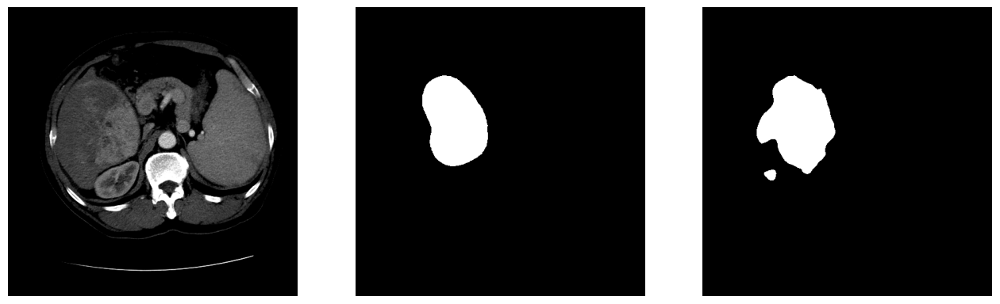

2


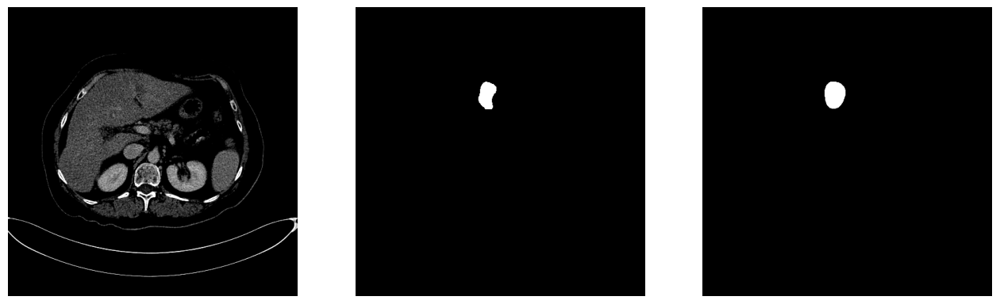

3


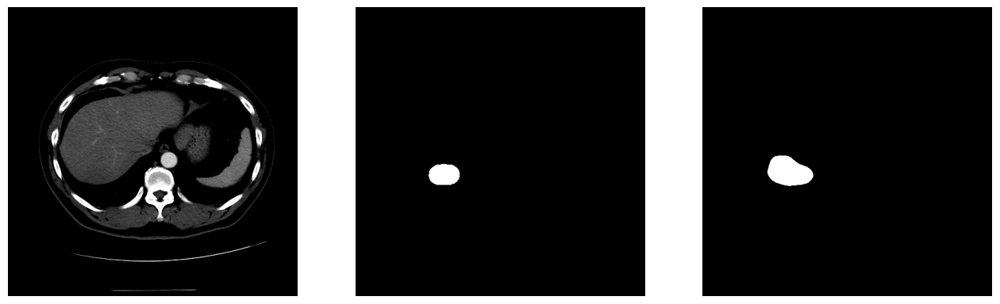

4


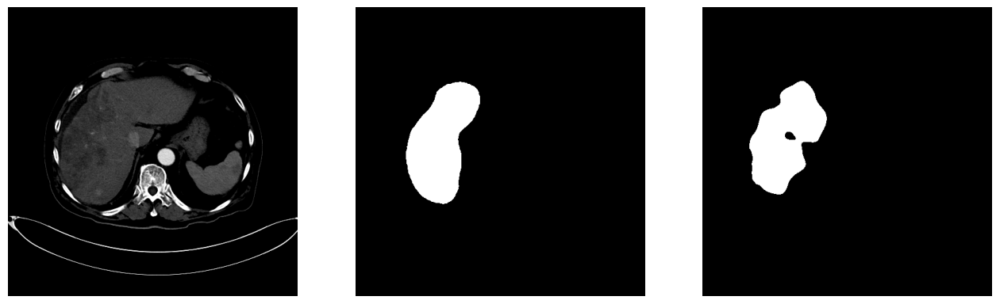

5


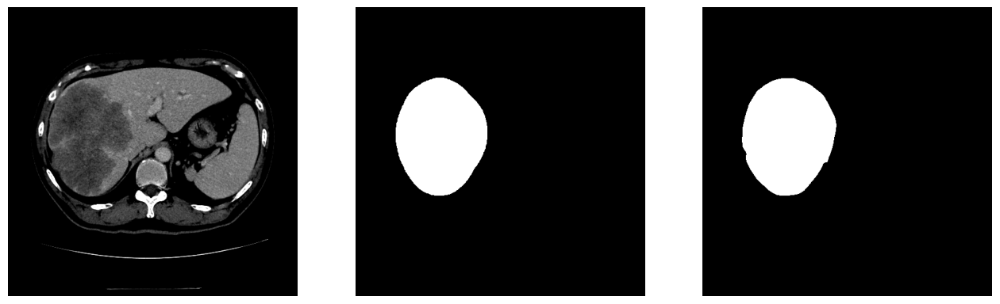

6


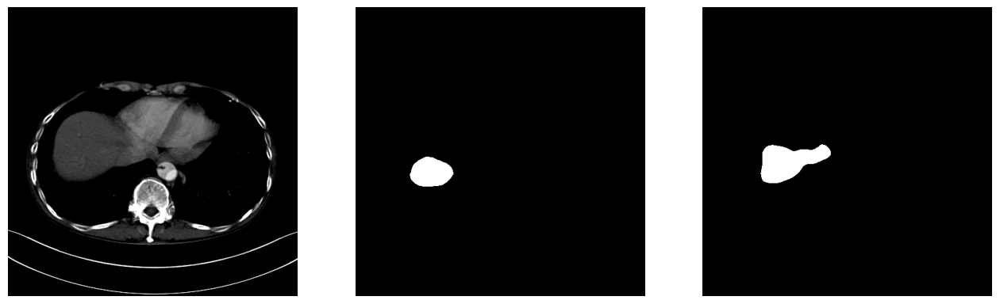

7


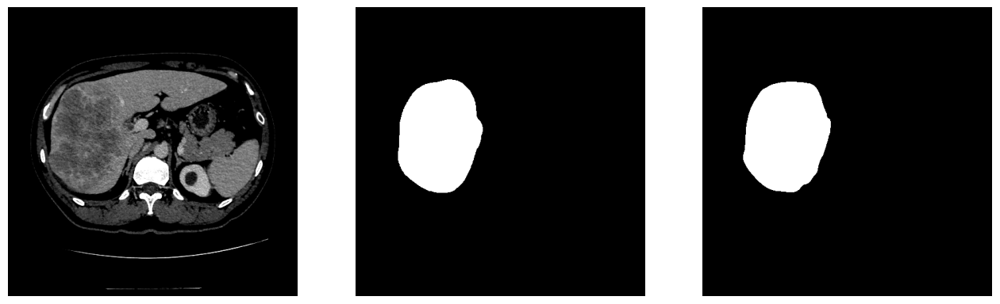

8


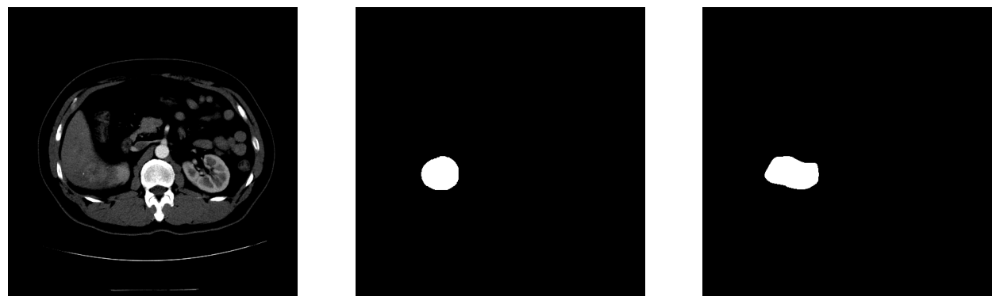

9


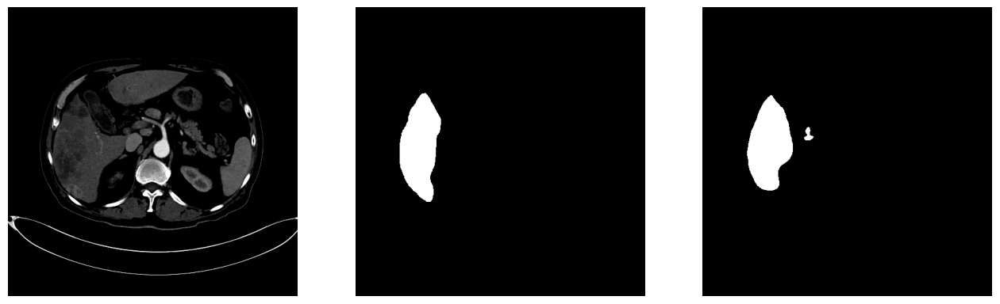

10


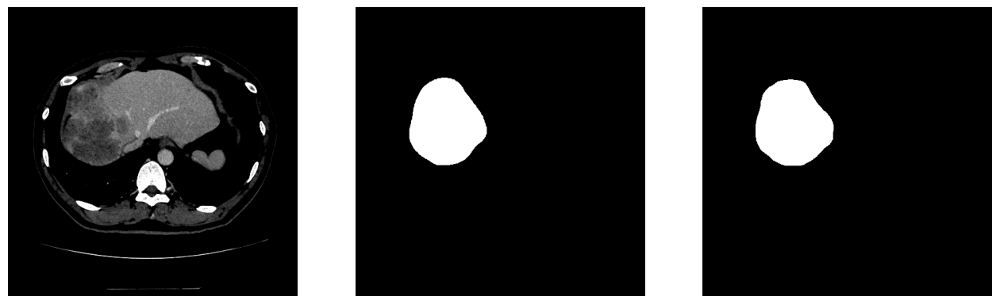

11


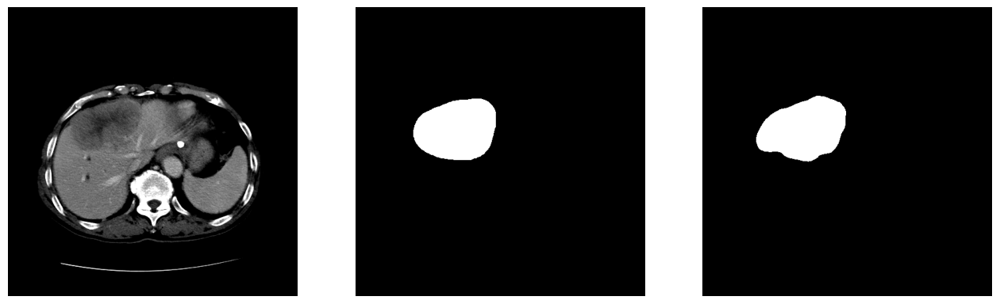

12


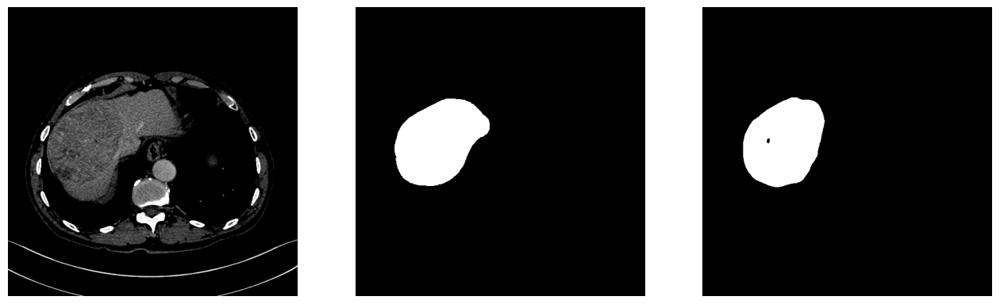

13


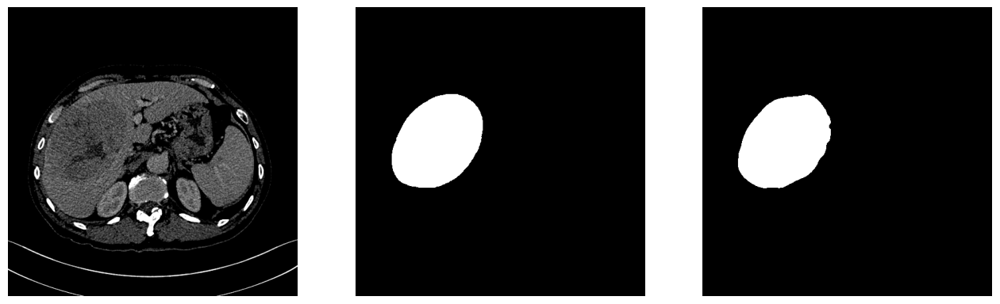

14


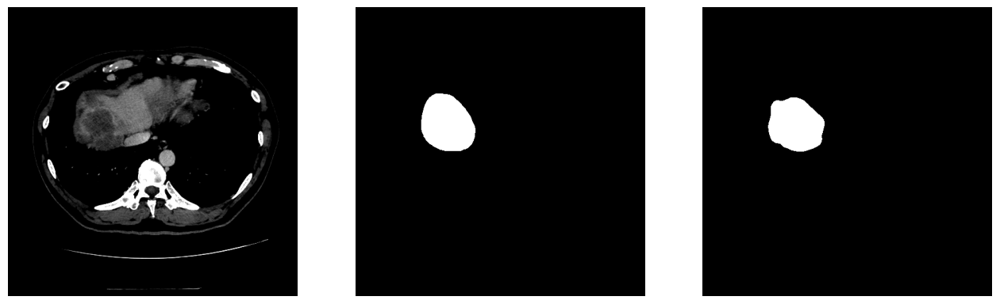

15


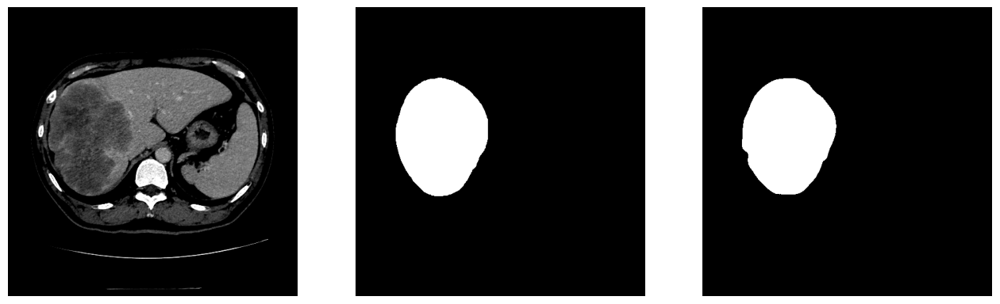

16


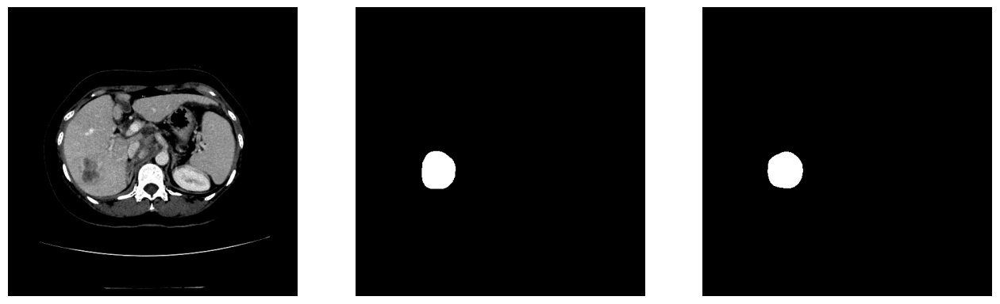

17


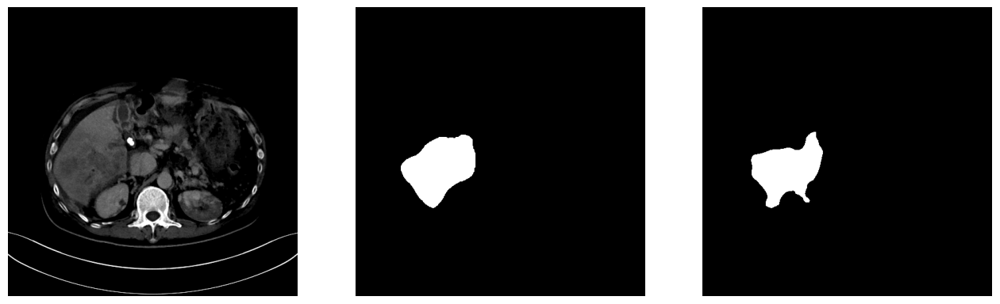

18


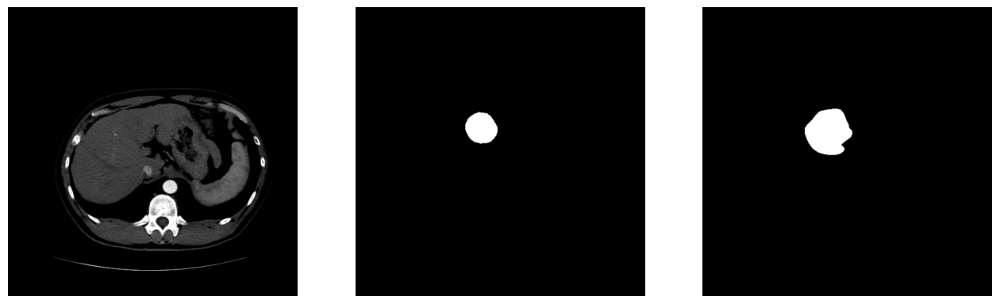

19


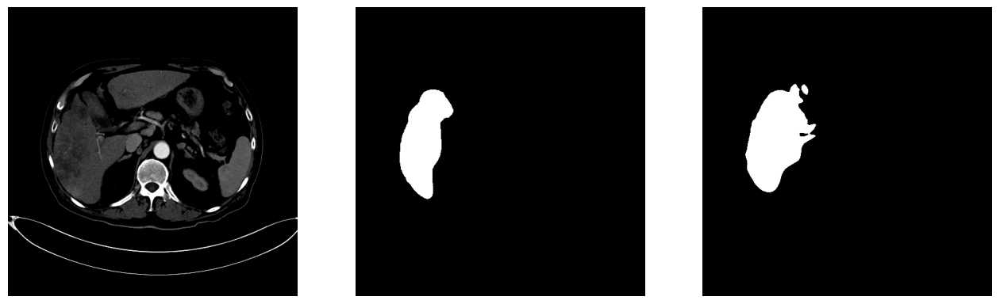

20


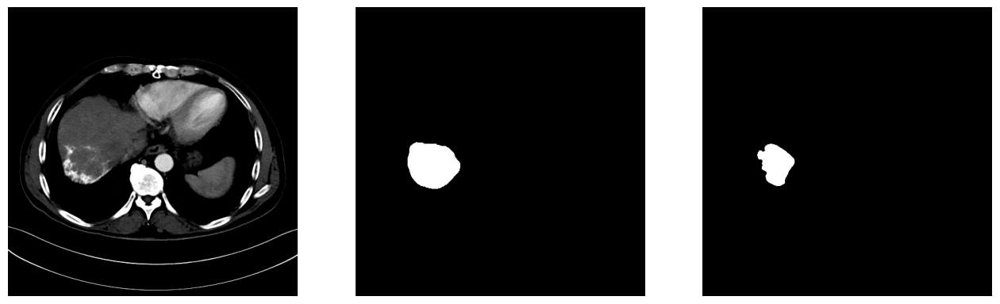

21


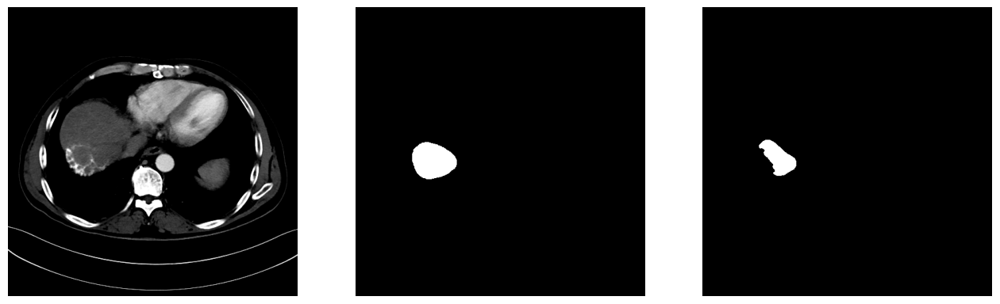

22


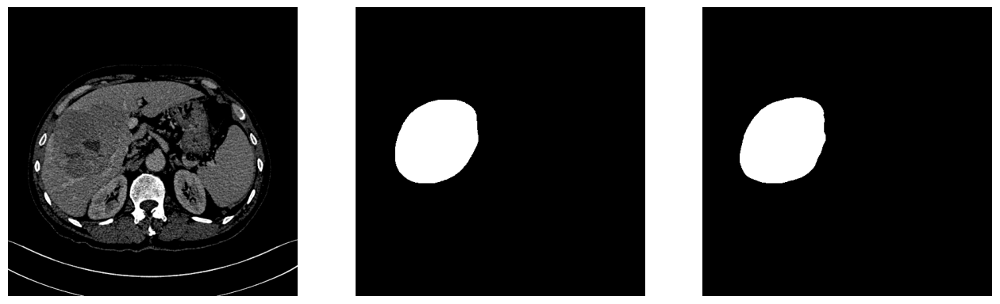

23


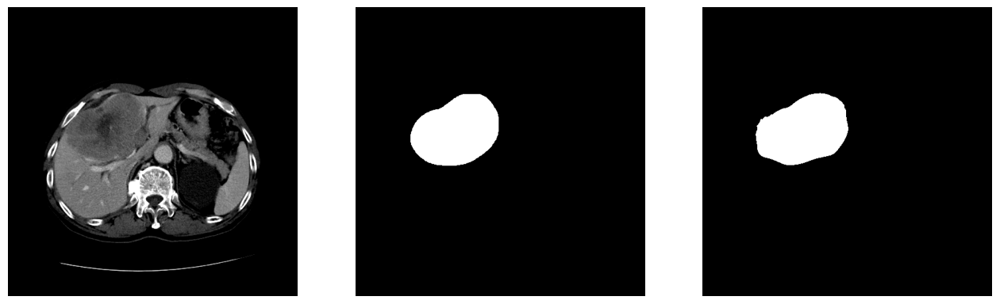

24


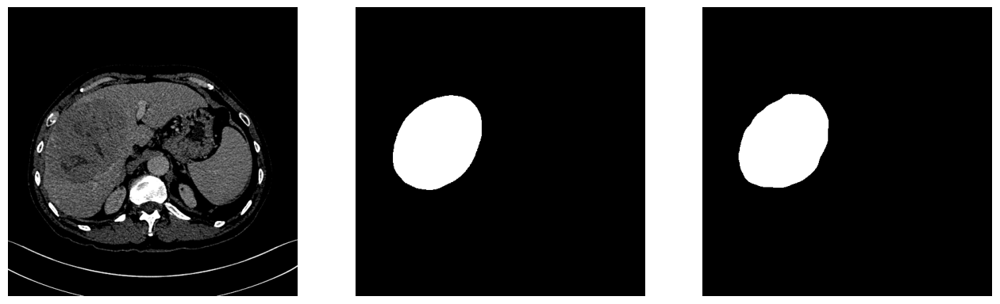

25


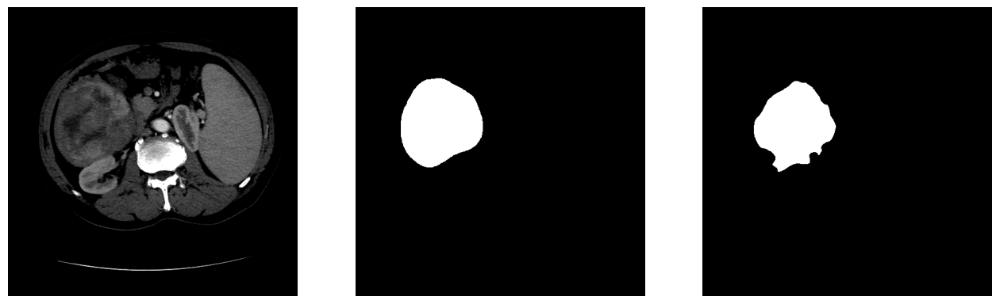

26


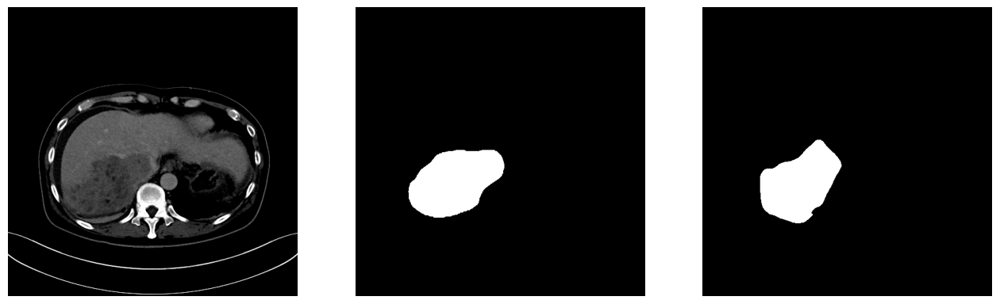

27


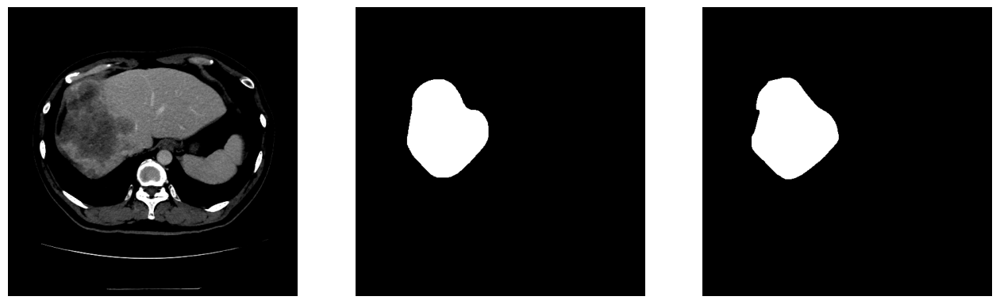

28


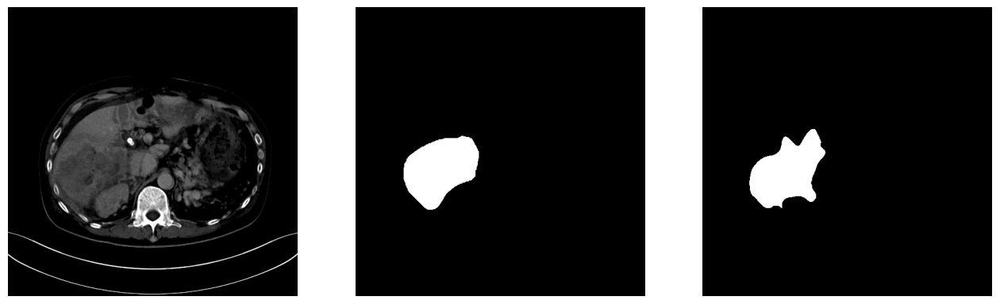

29


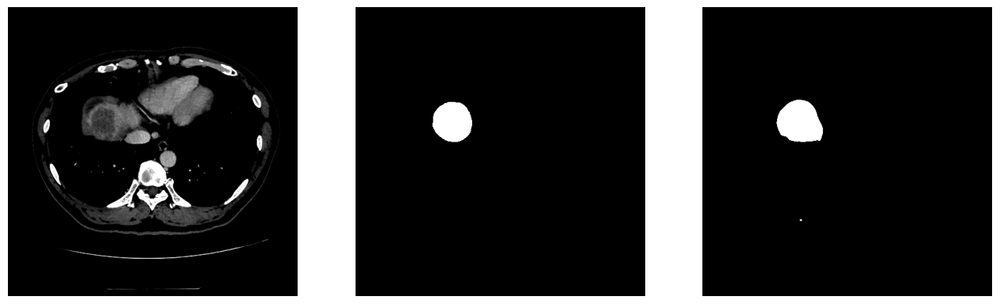

30


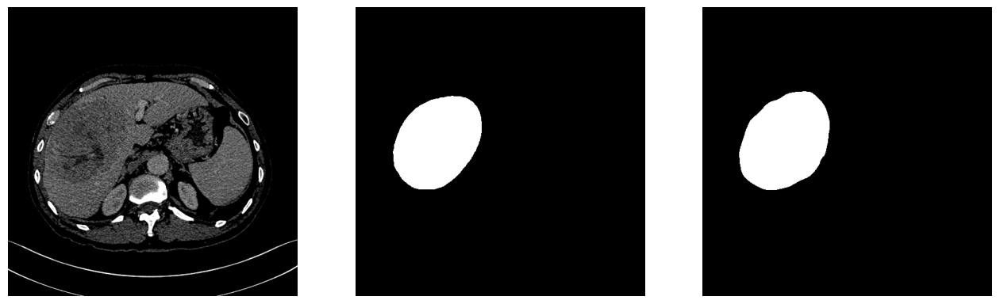

31


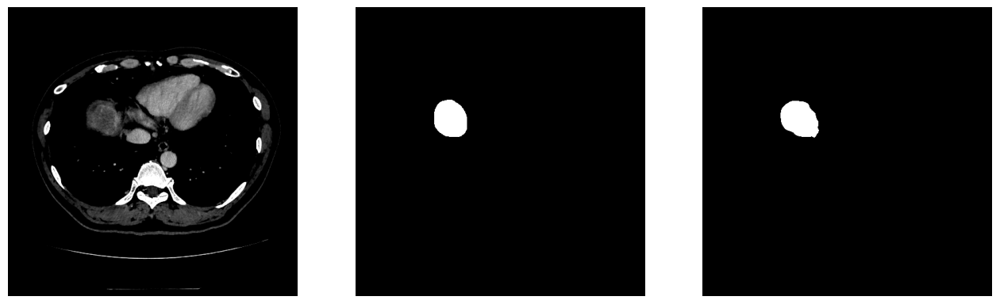

32


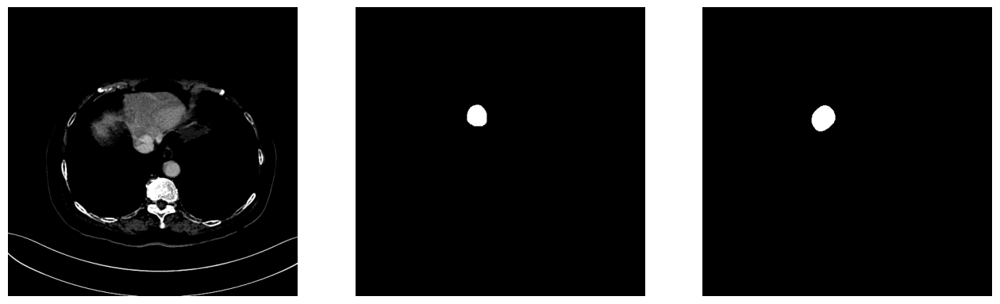

33


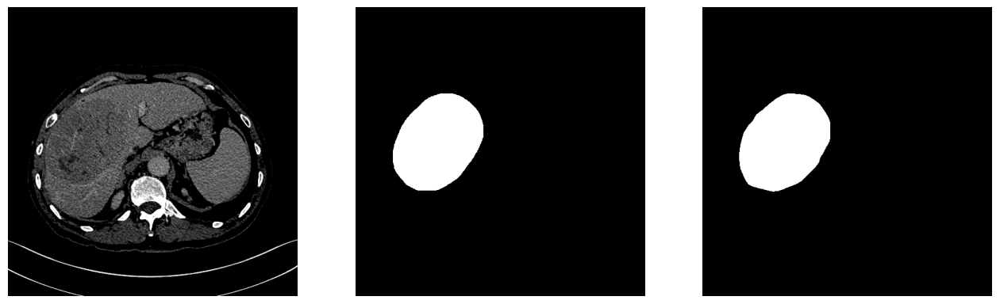

34


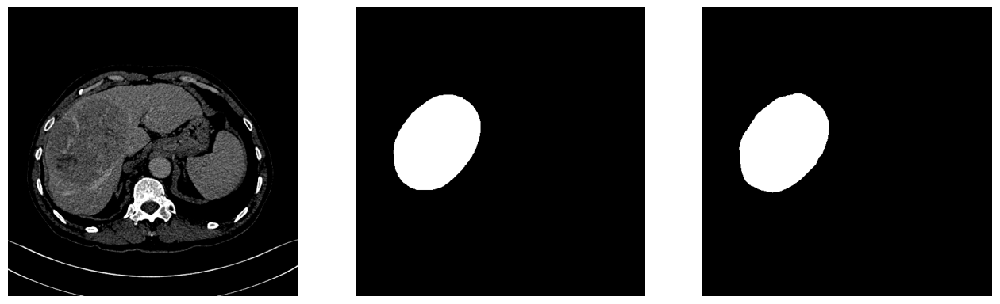

35


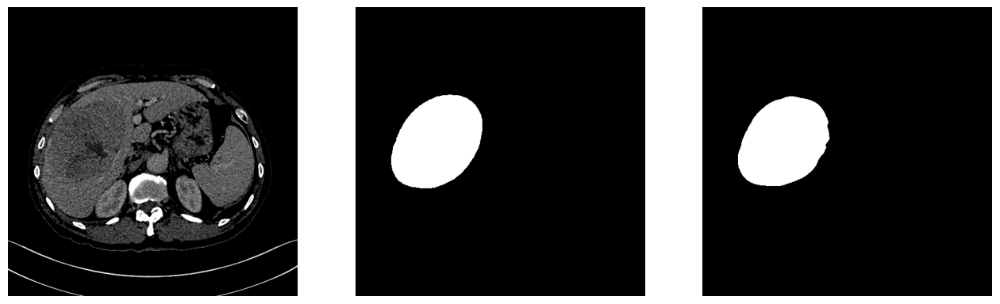

36


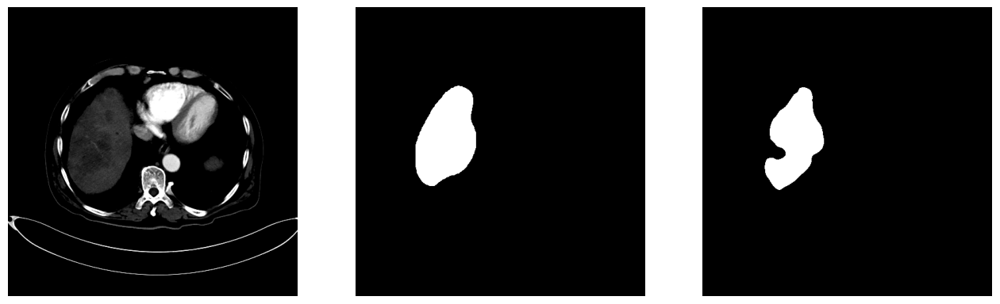

37


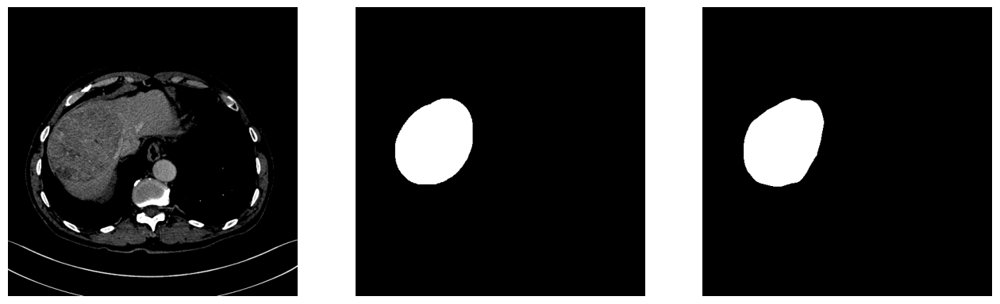

38


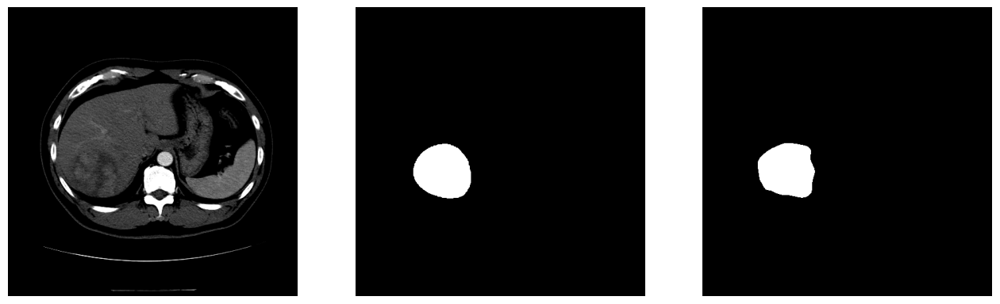

39


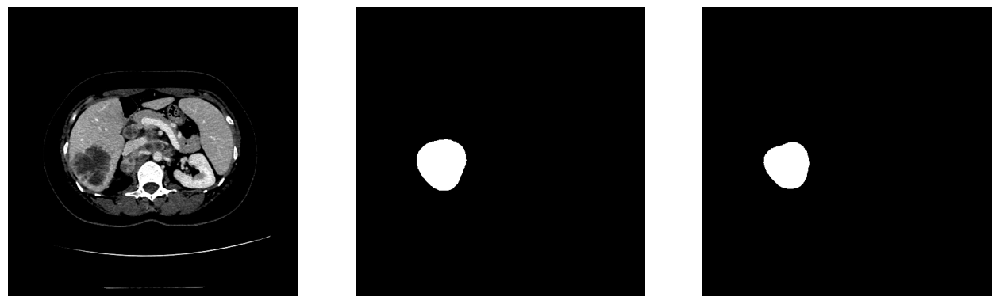

40


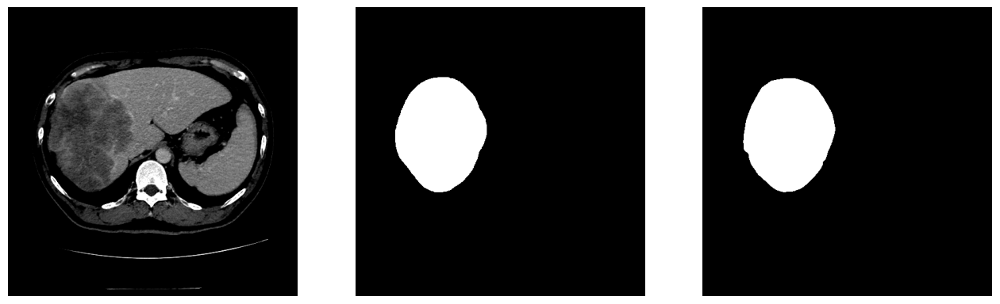

41


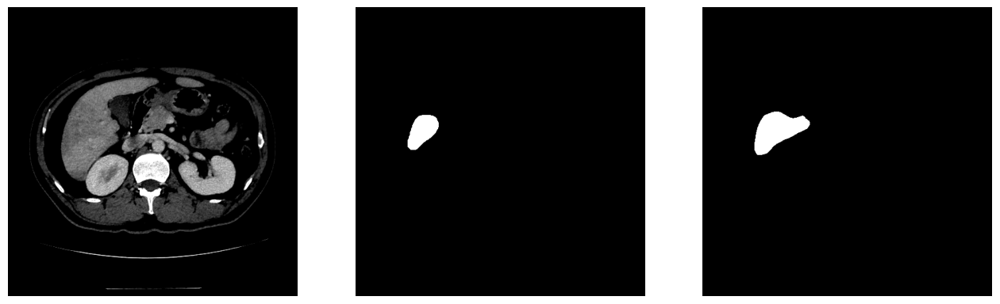

42


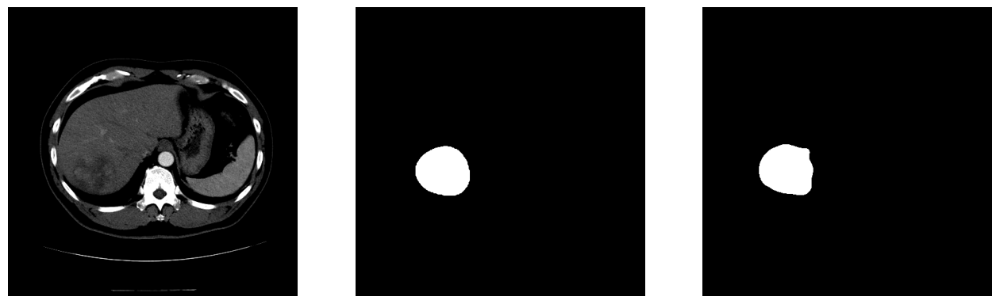

43


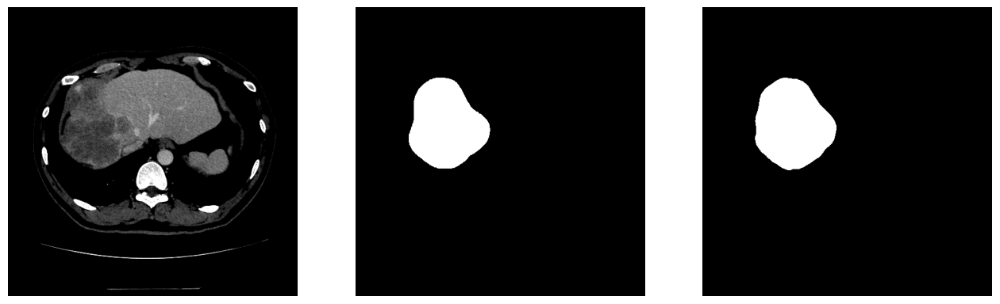

44


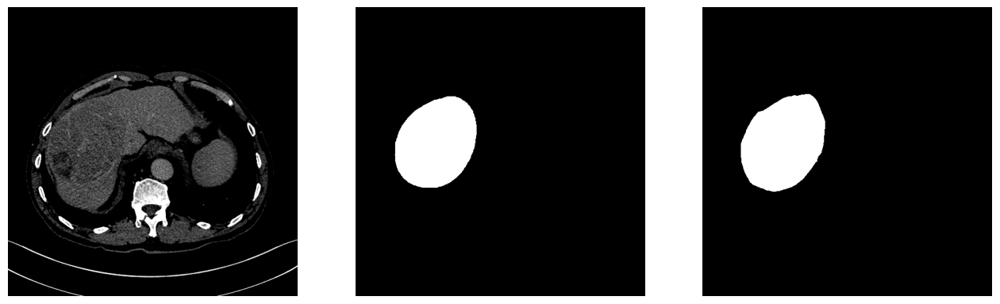

45


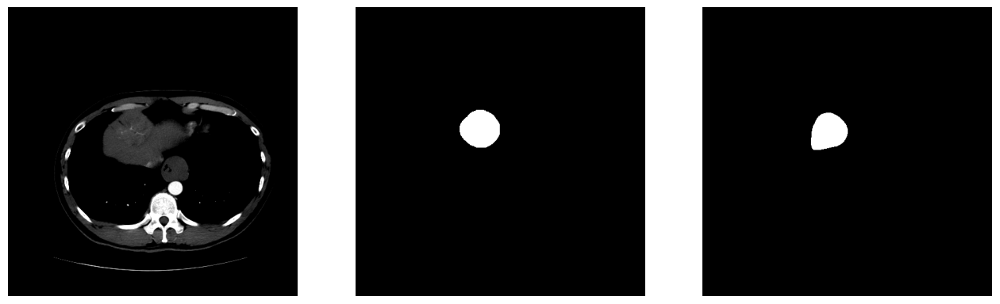

46


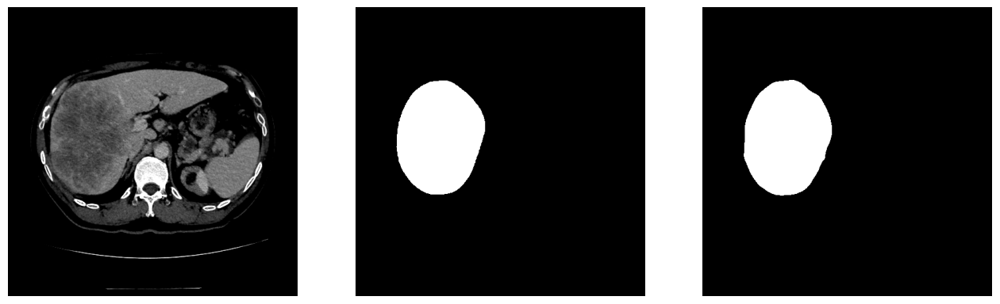

47


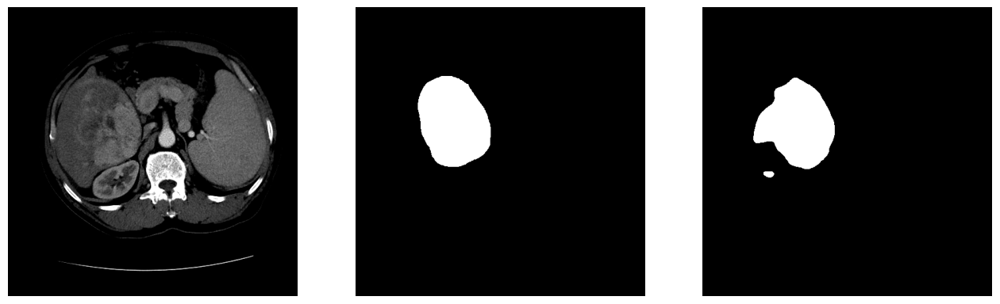

48


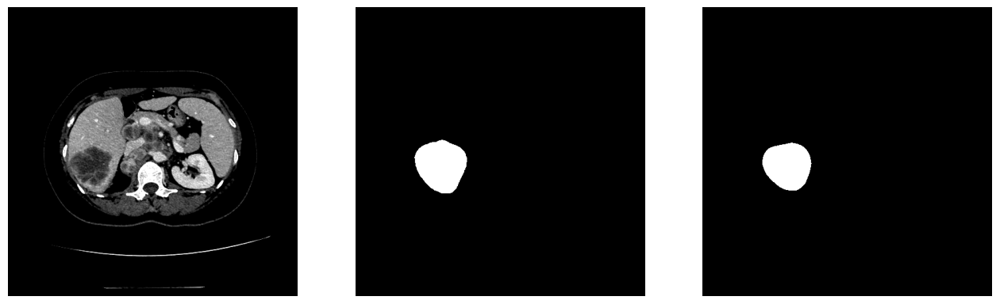

49


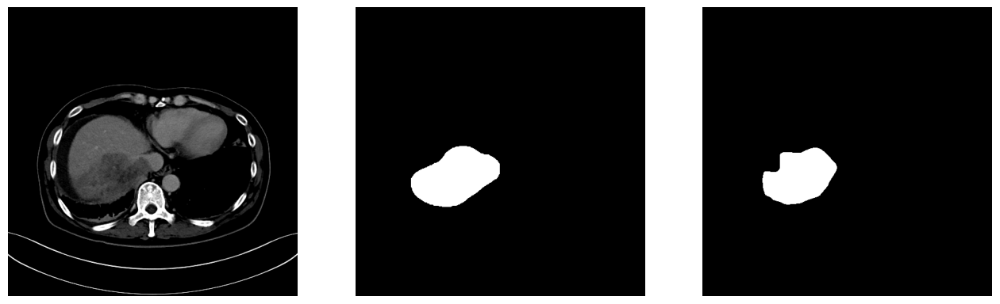

50


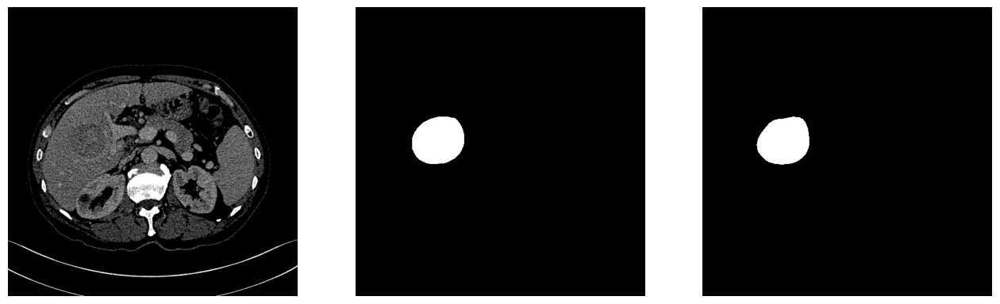

51


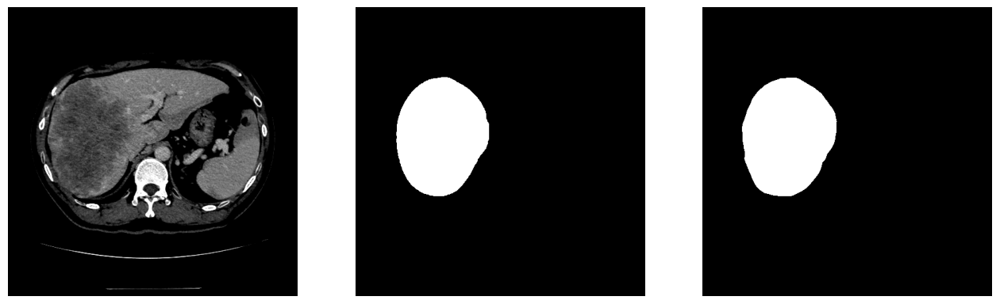

52


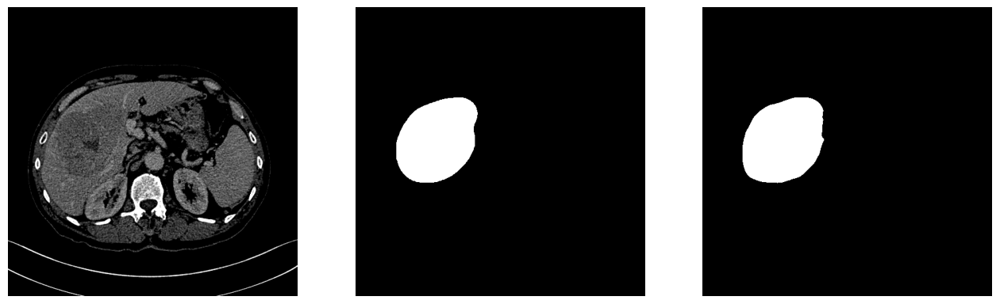

53


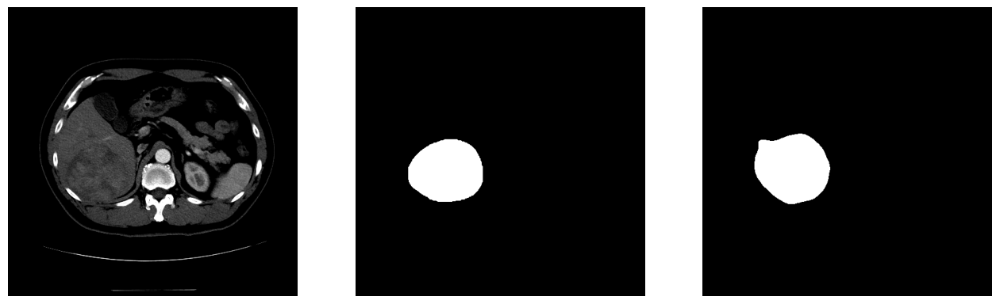

54


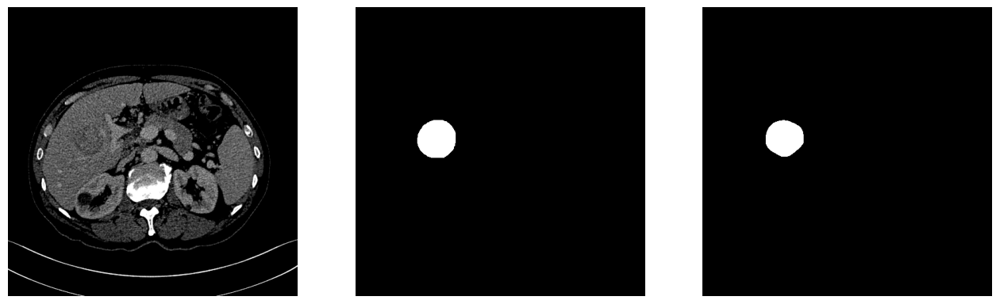

55


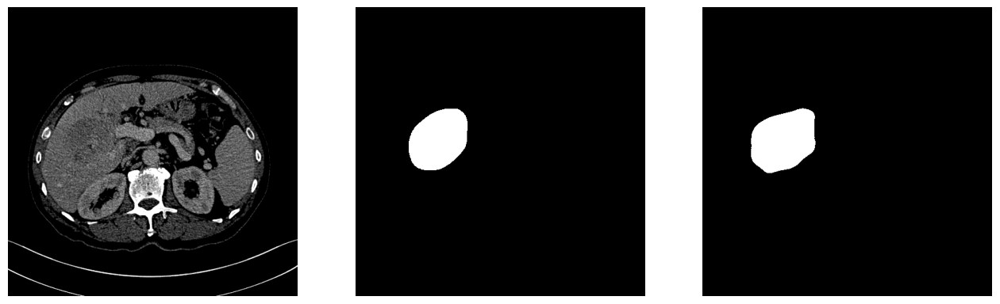

56


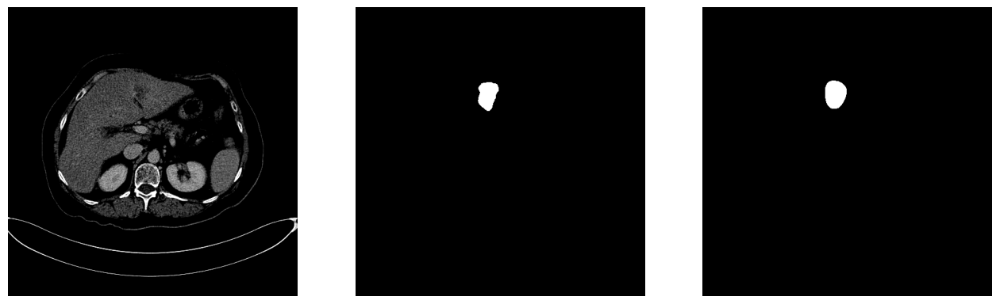

57


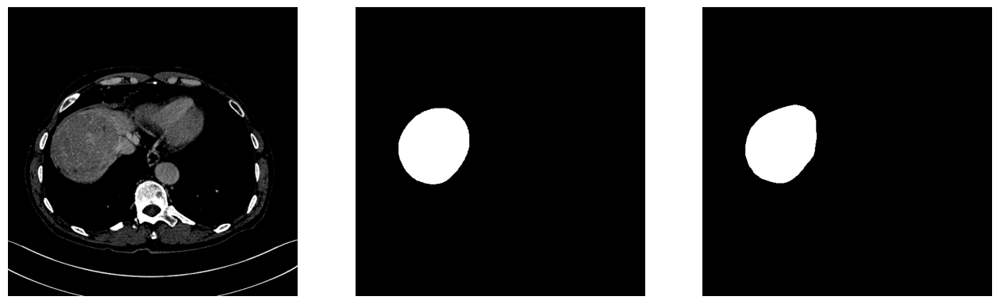

58


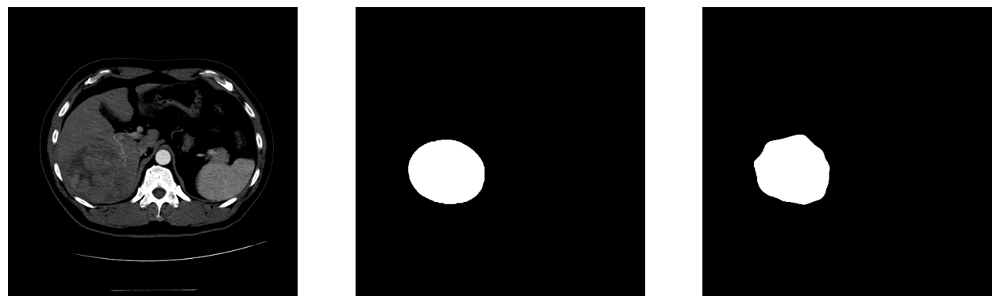

59


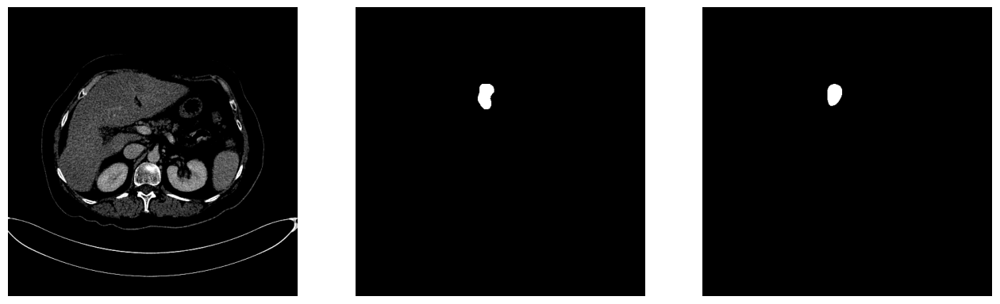

60


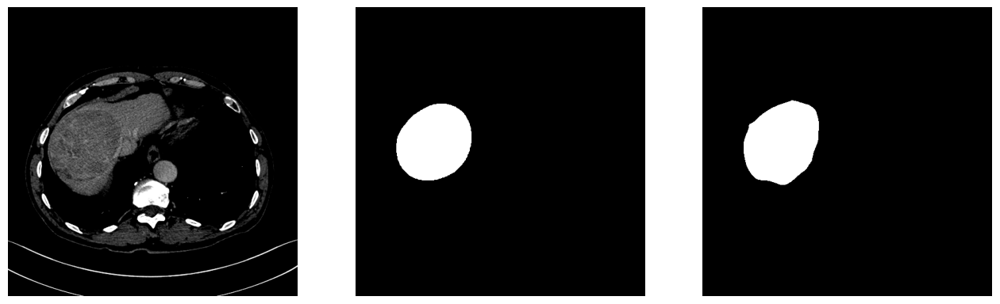

61


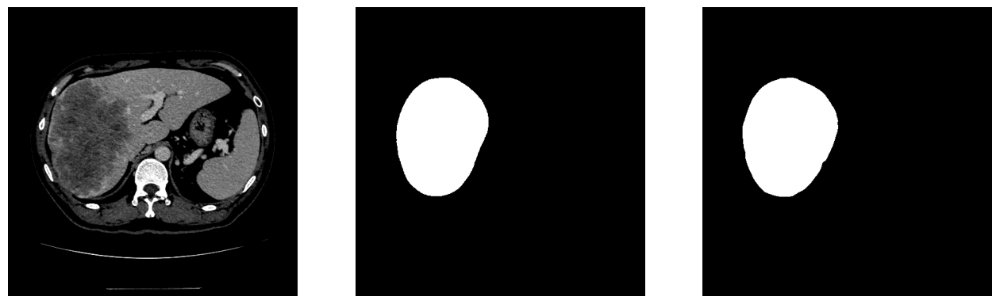

62


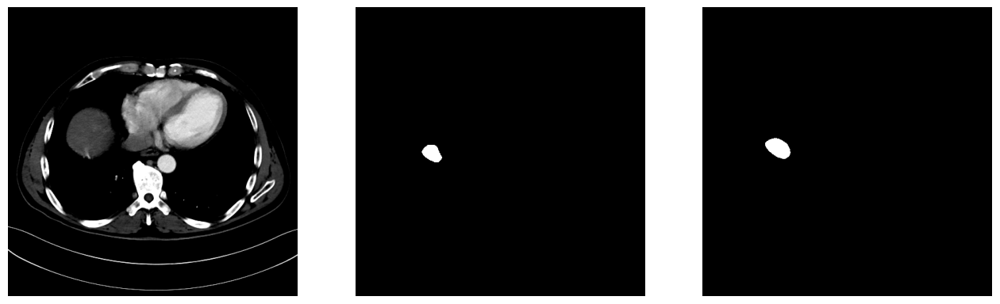

63


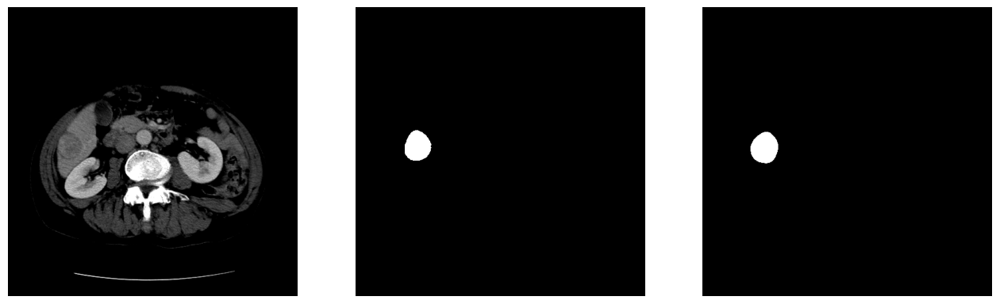

64


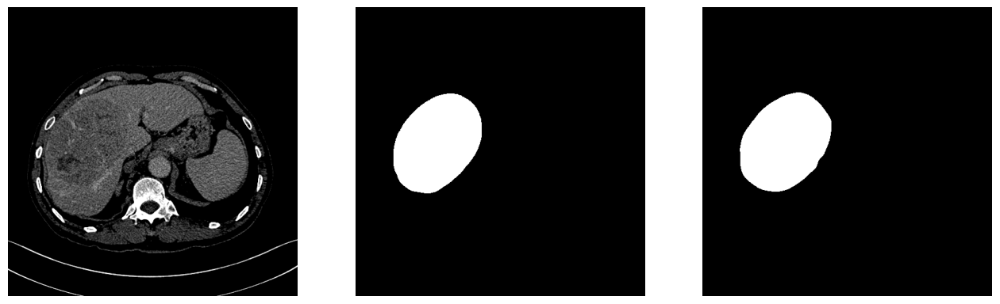

65


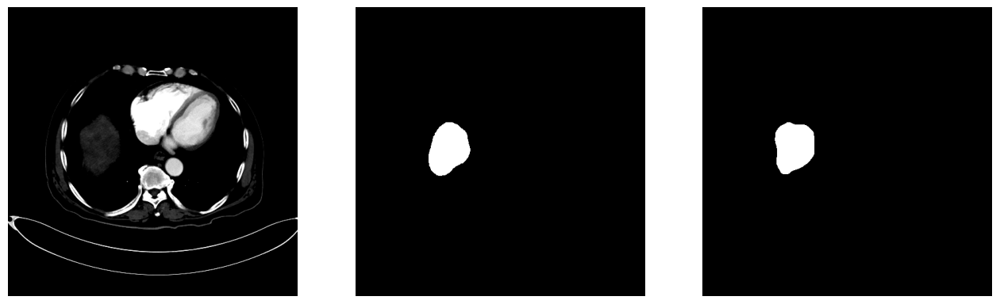

66


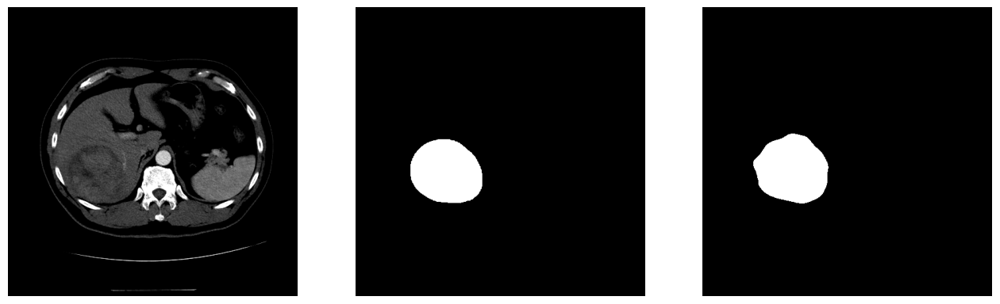

67


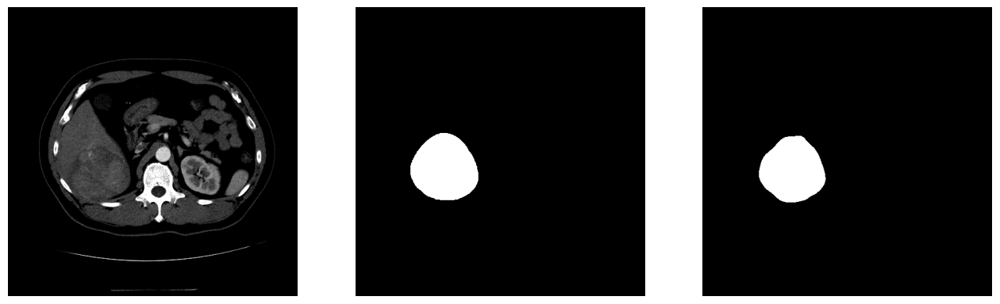

68


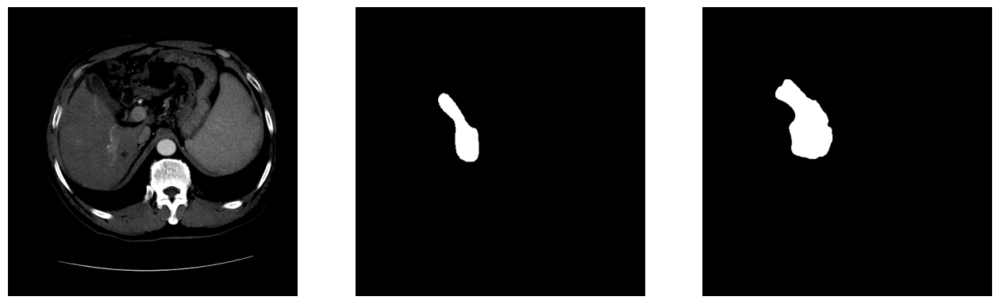

69


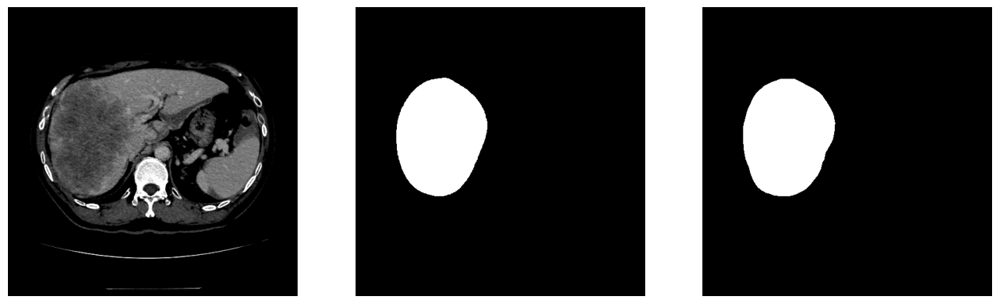

70


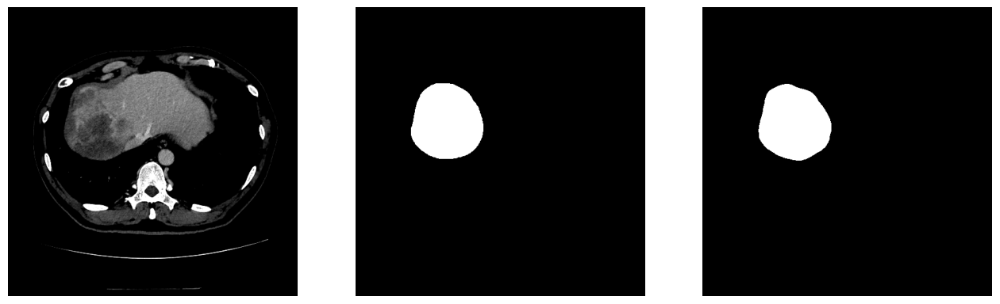

71


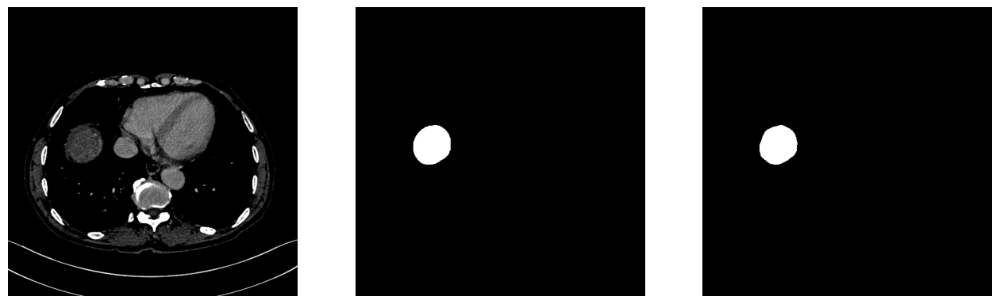

72


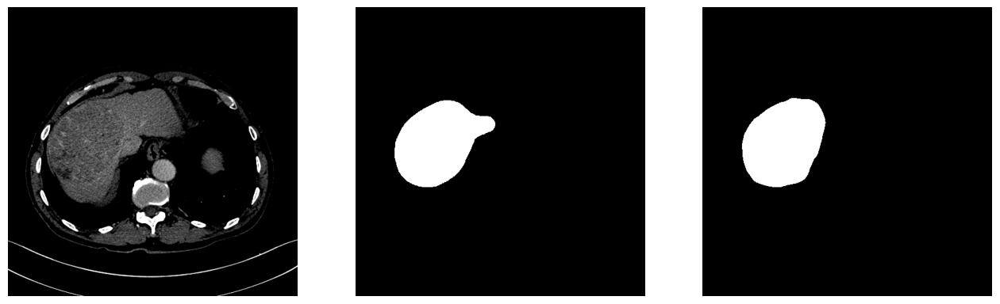

73


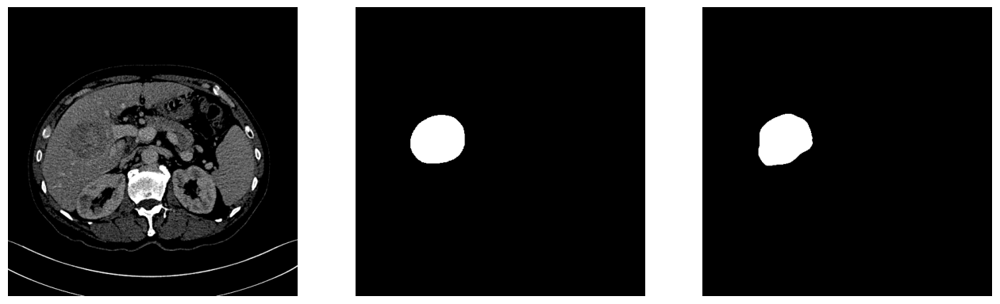

74


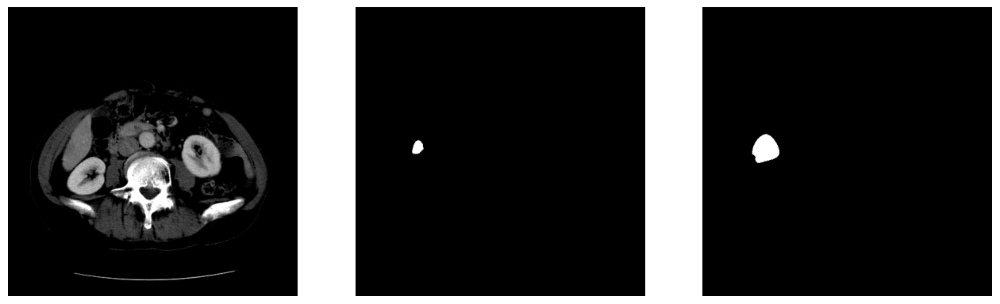

75


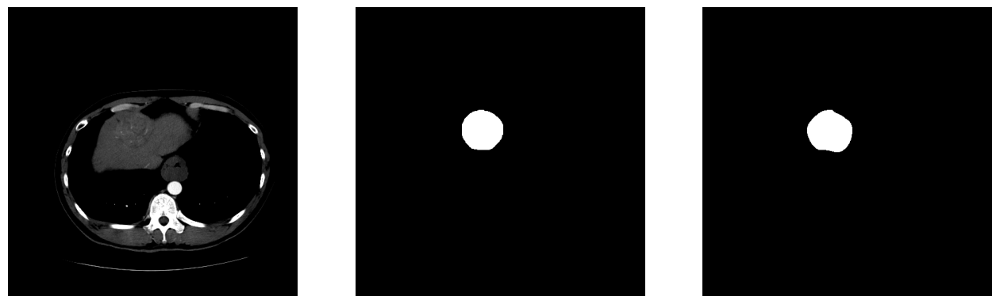

76


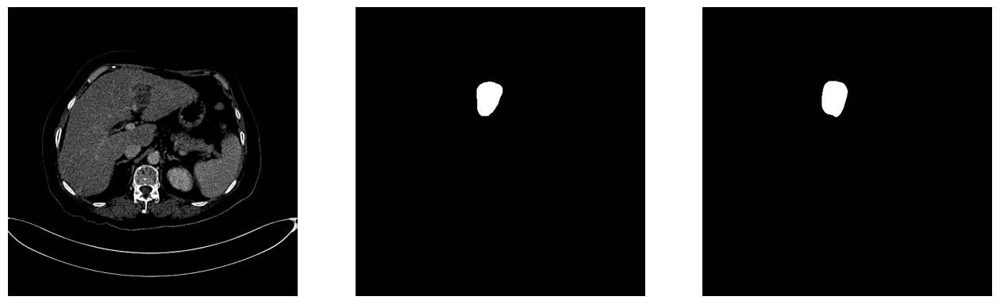

77


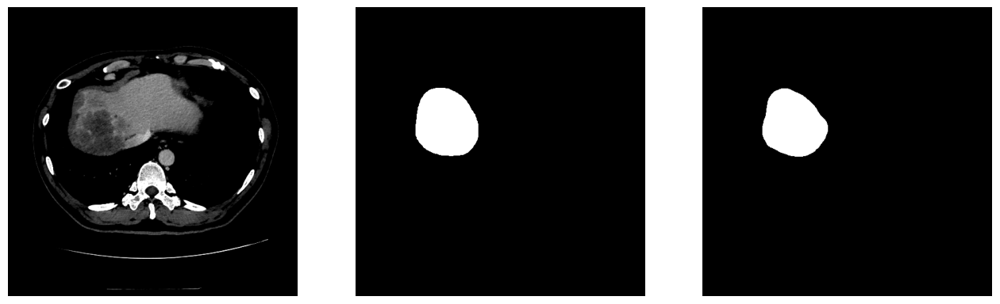

78


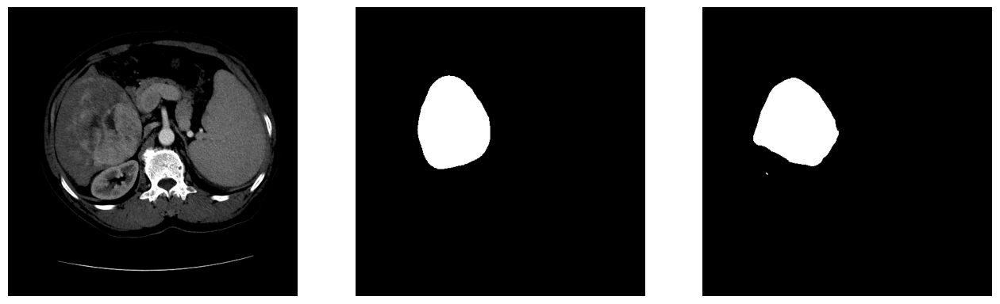

79


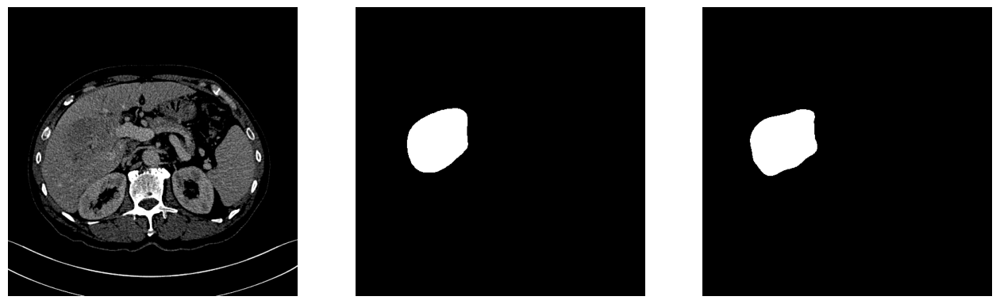

80


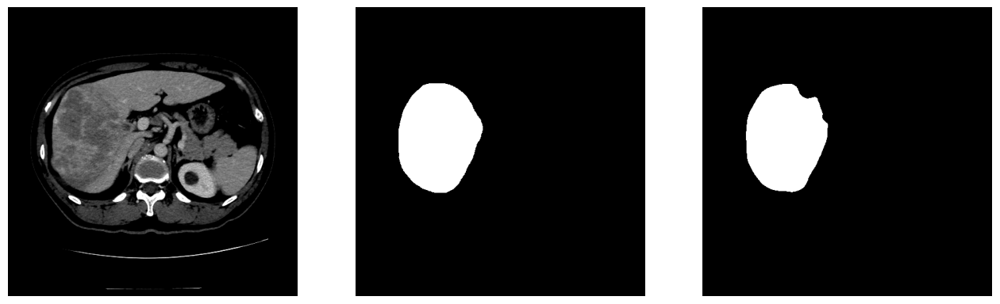

81


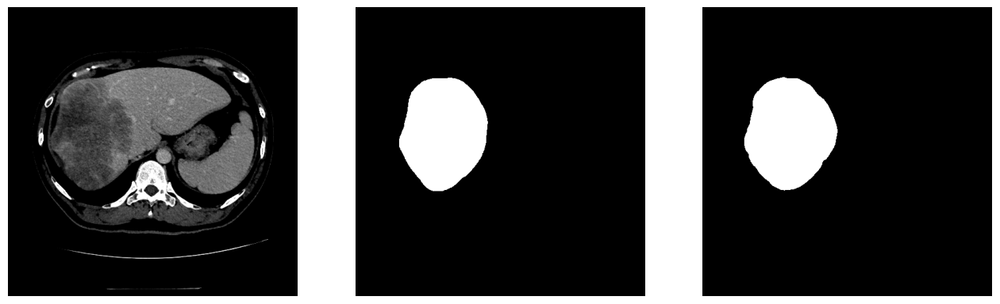

82


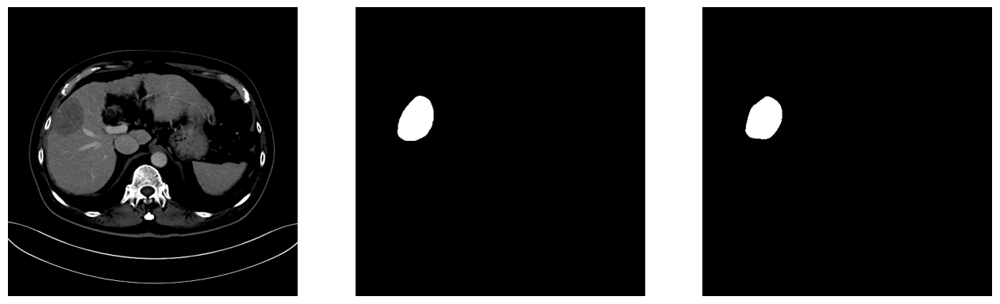

83


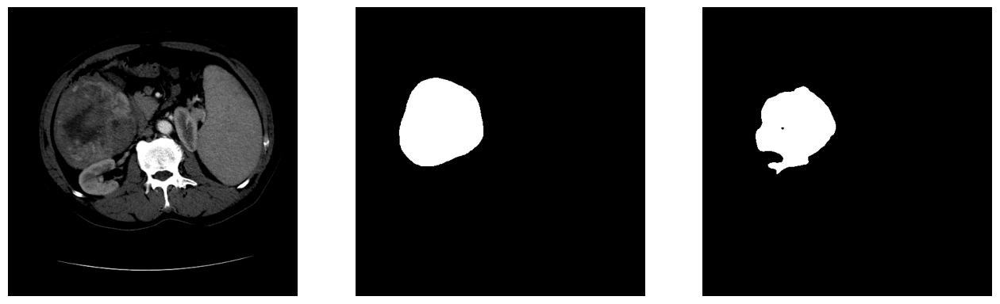

84


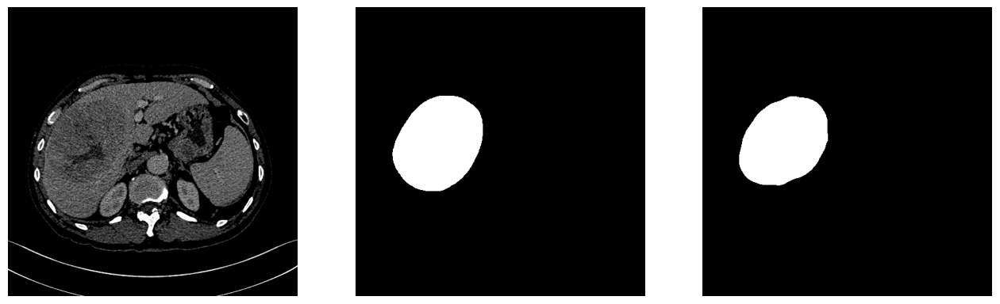

85


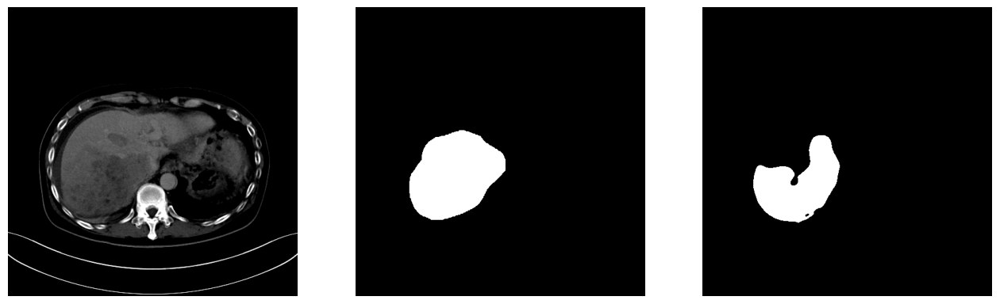

86


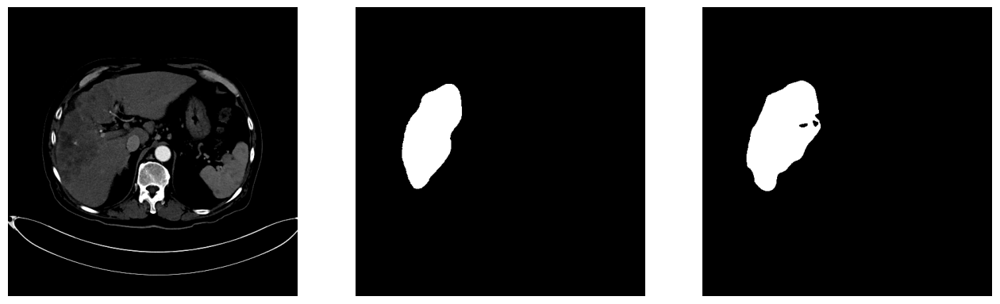

87


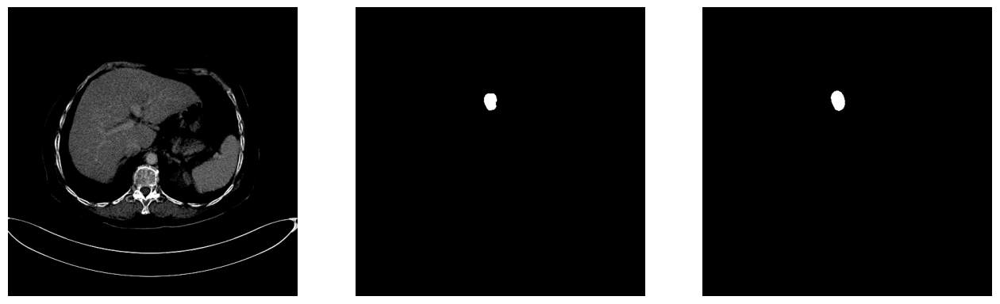

88


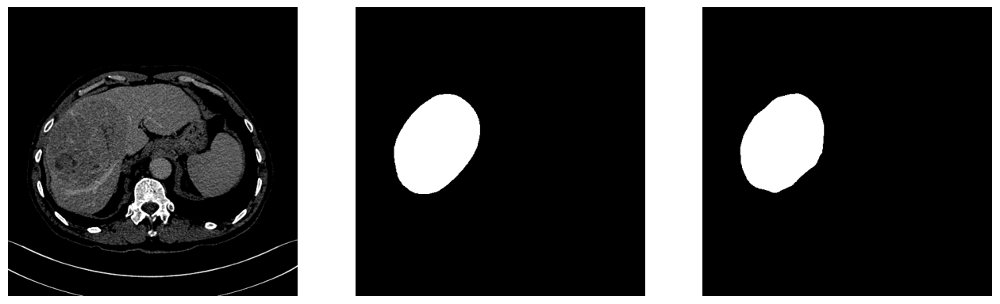

89


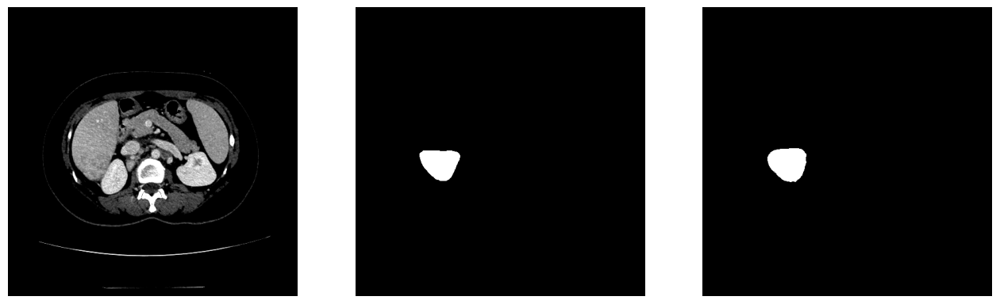

90


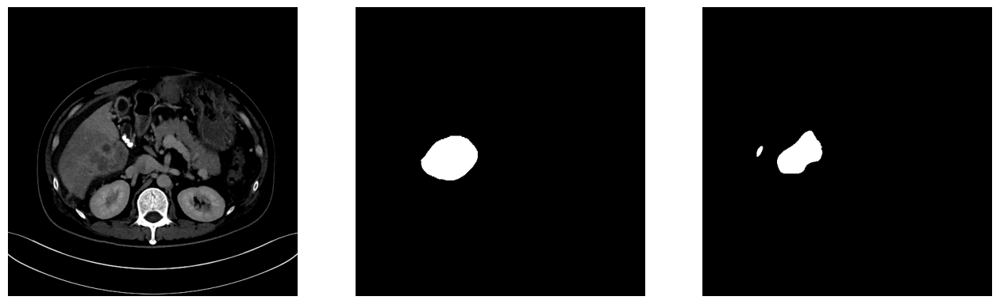

91


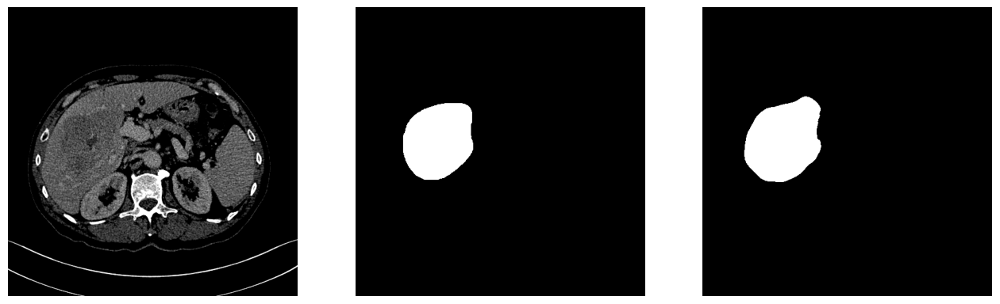

92


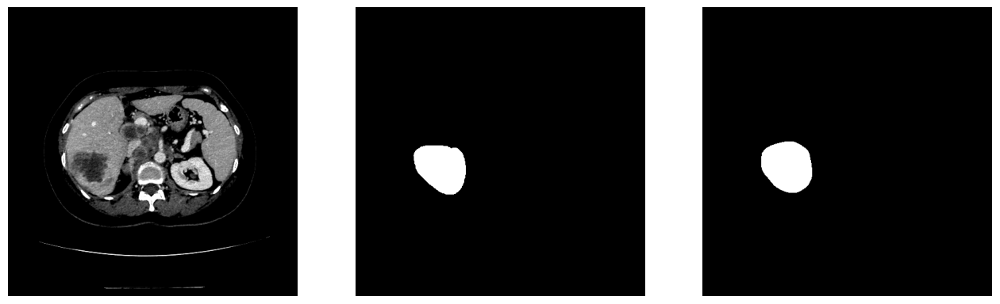

93


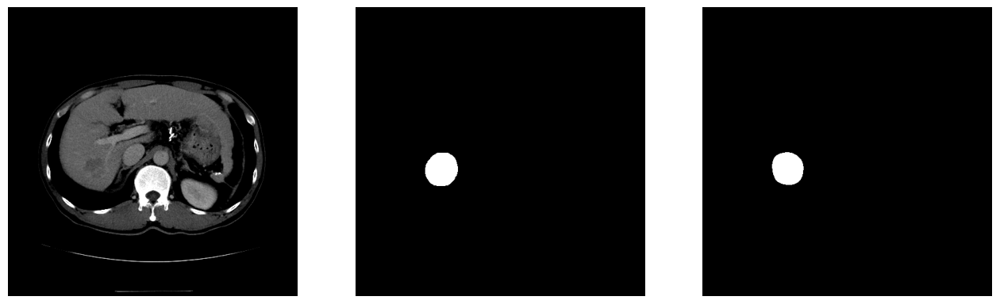

94


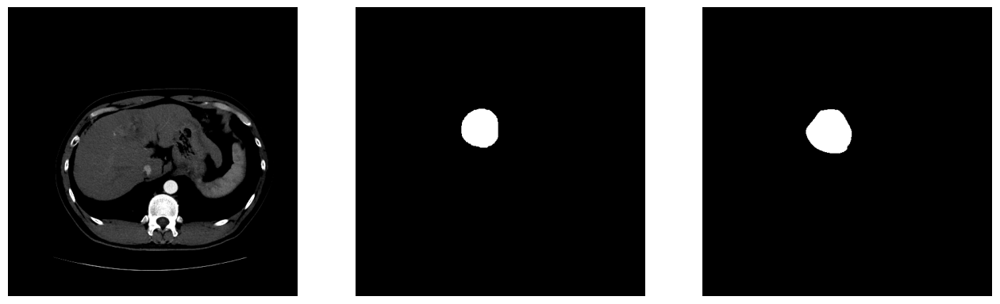

95


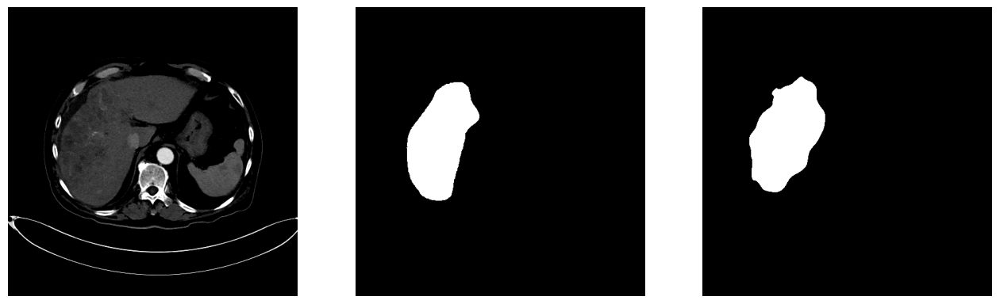

In [10]:
a = 0
for step, data in enumerate(test_loader):
    image, target = data
    image = image.to('cuda:0')
    output_seg = model(image)
    output_seg = torch.clamp(output_seg, 0, 1, out=None)
    output_seg = output_seg.detach().cpu().numpy()
    output_seg[output_seg>=0.5]=1
    output_seg[output_seg<0.5]=0
    target = target.detach().cpu().numpy()
    image = image.detach().cpu().numpy()
    
    output_seg = np.squeeze(output_seg)
    target = np.squeeze(target)
    image = np.squeeze(image)

    
    for i in range(image.shape[0]):
        a += 1
        print(a)
        plt.figure(figsize=(16,16))
        plt.axis('off')
        plt.subplot(131)
        img = PIL.Image.fromarray(np.array(image[i,:,:]))
        #img = cv2.resize(img,(320,240))
        plt.imshow(img,cmap='gray')
        plt.axis('off')
        plt.subplot(132)
        #target = np.array(target[i,:,:])
        #target = cv2.resize(target,(320,250))
        plt.imshow(target[i,:,:],cmap='gray')
        plt.axis('off')
        plt.subplot(133)
        plt.axis('off')
        #output_seg = np.array(output_seg[i,:,:])
        #output_seg = cv2.resize(output_seg,(320,250))
        plt.imshow(output_seg[i,:,:],cmap='gray')
        plt.show()
        plt.close()
    

In [7]:
a = 0
info = []
dsc = 0
for step, data in enumerate(test_loader):
    image, target = data
    image = image.to('cuda:0')
    output_seg = model(image)
    output_seg = torch.clamp(output_seg, 0, 1, out=None)
    output_seg = output_seg.detach().cpu().numpy()
    output_seg[output_seg>=0.5]=1
    output_seg[output_seg<0.5]=0
    target = target.detach().cpu().numpy()
    image = image.detach().cpu().numpy()
    output_seg = np.squeeze(output_seg)
    target = np.squeeze(target)
    image = np.squeeze(image)
    
    for i in range(image.shape[0]):
        a += 1
        #print(a)
        if (np.sum(output_seg[i,:, :]) > 0):
            DSC = dc(output_seg[i,:,:],target[i,:,:])
            #JC = jc(output_seg[i,:,:],target[i,:,:])
            JC = jc(output_seg[i,:,:],target[i,:,:])
            #dsc += DSC
            assd = binary_assd(output_seg[i,:,:],target[i,:,:])
            #ASSD = assd(output_seg[i,:,:],target[i,:,:])
            rec=recall(output_seg[i,:,:],target[i,:,:])
            #spec=specificity(output_seg[i,:,:],target[i,:,:])
            #sens=sensitivity(output_seg[i,:,:],target[i,:,:])
            Precision=precision(output_seg[i,:,:],target[i,:,:])
            HD = hd(output_seg[i,:,:],target[i,:,:])
            #print(DSC,JC,HD)
            #print(DSC,JC)
            info_item=[]
            info_item.append(a)
            info_item.append(DSC)
            info_item.append(JC)
            info_item.append(rec)
            info_item.append(assd)
            #info_item.append(spec)
            #info_item.append(sens)
            info_item.append(Precision)
            info_item.append(HD)
            info.append(info_item)
            col = ['id','dsc','jc','recall','assd','precision','HD']
            file_csv = pd.DataFrame(data=info,columns=col)
            file_csv.to_csv('/home/ma-user/work/weight/lossfunction/mri/mri.csv',index=False)
   

/home/ma-user/anaconda3/envs/PyTorch-1.10.2/lib/python3.7/site-packages/torch/nn/functional.py:3635: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


In [ ]:
from rt_utils import RTStructBuilder
import matplotlib.pyplot as plt
import os
import gzip
import pickle
label_path = '/home/ma-user/work/mri/label/'

# Load existing RT Struct. Requires the series path and existing RT Struct path
rtstruct = RTStructBuilder.create_from(
  dicom_series_path="/home/ma-user/work/mri-dcm/R898538/", 
  rt_struct_path="/home/ma-user/work/mri-dcm/R898538/RS.R898538.MRI_1.dcm"
)

# View all of the ROI names from within the image
print(rtstruct.get_roi_names())

# Loading the 3D Mask from within the RT Struct
mask_3d = rtstruct.get_roi_mask_by_name("CTV")
for z in range(mask_3d.shape[2]):
# Display one slice of the region
    print(z)
    first_mask_slice = mask_3d[:, :, z]
    plt.figure(figsize=(10,10))
    plt.imshow(first_mask_slice, 'gray')
    plt.show()
    plt.axis('off')
    path = os.path.join(label_path, 'R898538' + '_%d.pkl.gz' % z)
    file = gzip.open(path, 'wb')
    pickle.dump(first_mask_slice, file, protocol=3)
    file.close()
    #dump_image(label_path, mask_3d)

In [54]:
a = 0
info = []
dsc = 0
for step, data in enumerate(test_loader):
    image, target = data
    image = image.to('cuda:0')
    output_seg = model(image)
    output_seg = torch.clamp(output_seg, 0, 1, out=None)
    output_seg = output_seg.detach().cpu().numpy()
    output_seg[output_seg>=0.5]=1
    output_seg[output_seg<0.5]=0
    target = target.detach().cpu().numpy()
    image = image.detach().cpu().numpy()
    output_seg = np.squeeze(output_seg)
    target = np.squeeze(target)
    image = np.squeeze(image)
    
    for i in range(image.shape[0]):
        a += 1
        #print(a)
        if (np.sum(output_seg[i,:, :]) > 0):
            DSC = dc(output_seg[i,:,:],target[i,:,:])
            #JC = jc(output_seg[i,:,:],target[i,:,:])
            JC = jc(output_seg[i,:,:],target[i,:,:])
            #dsc += DSC
            assd = binary_assd(output_seg[i,:,:],target[i,:,:])
            #ASSD = assd(output_seg[i,:,:],target[i,:,:])
            rec=recall(output_seg[i,:,:],target[i,:,:])
            #spec=specificity(output_seg[i,:,:],target[i,:,:])
            #sens=sensitivity(output_seg[i,:,:],target[i,:,:])
            Precision=precision(output_seg[i,:,:],target[i,:,:])
            HD = hd95(output_seg[i,:,:],target[i,:,:])
            #print(DSC,JC,HD)
            #print(DSC,JC)
            info_item=[]
            info_item.append(a)
            info_item.append(DSC)
            info_item.append(JC)
            info_item.append(rec)
            info_item.append(assd)
            #info_item.append(spec)
            #info_item.append(sens)
            info_item.append(Precision)
            info_item.append(HD)
            info.append(info_item)
            col = ['id','dsc','jc','recall','assd','precision','HD']
            file_csv = pd.DataFrame(data=info,columns=col)
            file_csv.to_csv('/home/ma-user/work/weight/unet/ct.csv',index=False)
   